# Unsupervised Learning: Segmenting Customers Using Behavioural and Demographic Clustering
Link to dataset: https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis/data

### Importing the necessary libraries

In [1]:
# Core libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocessing
from sklearn.preprocessing import StandardScaler, LabelEncoder,OrdinalEncoder 
from sklearn.decomposition import PCA

# Clustering models
from sklearn.cluster import KMeans, AgglomerativeClustering

# Evaluation metrics
from sklearn.metrics import silhouette_score, silhouette_samples
from mpl_toolkits.mplot3d import Axes3D 

# Hierarchical clustering dendrogram
from scipy.cluster.hierarchy import dendrogram, linkage

# Distance calculations (for linkage)
from scipy.spatial.distance import pdist

In [2]:
# We load in our dataset using pandas
personality_df = pd.read_csv("marketing_campaign.csv", sep='\t') # We use '\t' as the separator because the file is tab-delimited
# Displaying the first 5 rows to gain understanding of the dataset's structure
personality_df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [3]:
# We get a concise summary of our features
personality_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [4]:
# We print the dataset's dimensions and column names for a quick structural overview
print("Dataset Shape:", personality_df.shape)
print("\nColumns:", personality_df.columns)

Dataset Shape: (2240, 29)

Columns: Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')


In [5]:
# We generate descriptive statistics for all numeric columns
personality_df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2216.0,52247.251354,25173.076661,1730.0,35303.00,51381.5,68522.00,666666.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0


### Checking for missing and duplicated values in our dataset

In [6]:
# Check for the total number of duplicate rows in the dataset
personality_df.duplicated().sum()

0

In [7]:
# Check for missing values in each column
personality_df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [8]:
# We check for the percentage of missing values in the 'Income' column
missing_percentage = (personality_df["Income"].isnull().sum() / len(personality_df)) * 100
print(f"Percentage of missing values in Income: {missing_percentage:.2f}%")

Percentage of missing values in Income: 1.07%


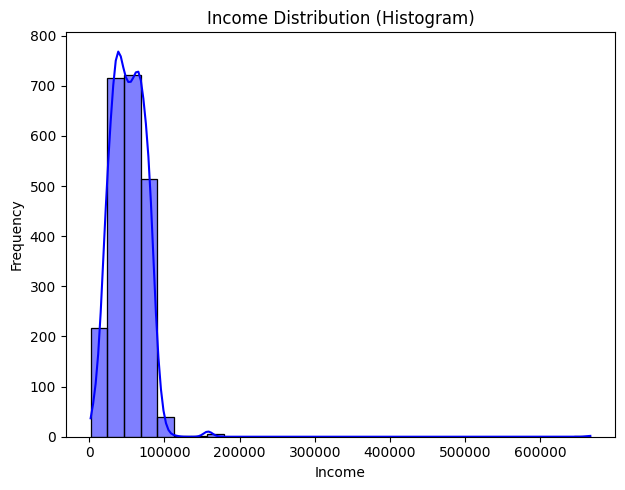

In [9]:
# Visualize the distribution of the 'Income' variable using a histogram with a KDE overlay
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(personality_df["Income"], bins=30, kde=True, color='blue')
plt.xlabel("Income")
plt.ylabel("Frequency")
plt.title("Income Distribution (Histogram)")
plt.tight_layout()
plt.show()

### Our income variable is right skewed and the missing value percentage is considerably low, hence we impute the missing values with median

In [10]:
# Since the distribution of Income is right-skewed, we use median to impute our missing values
personality_df["Income"].fillna(personality_df["Income"].median(), inplace=True)
personality_df.isnull().sum()

C:\Users\User\AppData\Local\Temp\ipykernel_4072\1049809103.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  personality_df["Income"].fillna(personality_df["Income"].median(), inplace=True)


ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

### Visualising our categorical and numerical features

In [11]:
# Identify categorical features by selecting columns with 'object' data type
categorical_features = personality_df.select_dtypes(include=["object"]).columns.tolist()

# Identify numerical features by selecting columns with integer and float data types
numerical_features = personality_df.select_dtypes(include=["int64", "float64"]).columns.tolist()

C:\Users\User\AppData\Local\Temp\ipykernel_4072\1021558726.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='Set2', order=df[col].value_counts().index)
C:\Users\User\AppData\Local\Temp\ipykernel_4072\1021558726.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='Set2', order=df[col].value_counts().index)
C:\Users\User\AppData\Local\Temp\ipykernel_4072\1021558726.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette='Set2', order=df[col].value_counts().index)


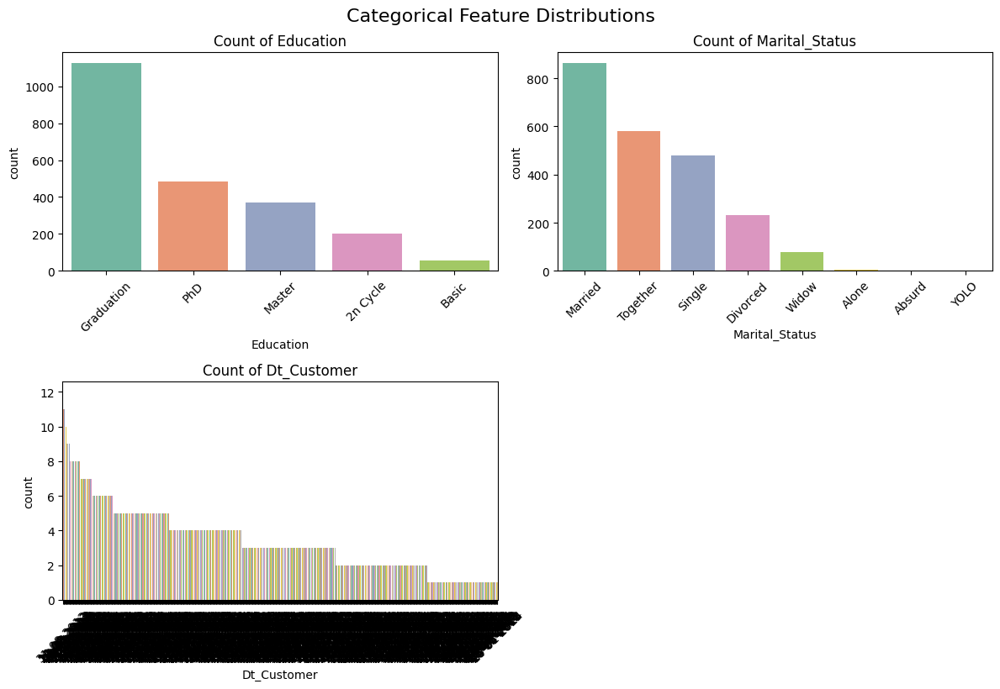

In [12]:
# Plot count plots for categorical features
def plot_categorical_distributions(df, categorical_features):
    n = len(categorical_features)
    n_cols = 2
    n_rows = (n + n_cols - 1) // n_cols

    # Loop through each categorical feature
    plt.figure(figsize=(n_cols * 6, n_rows * 4))

    for i, col in enumerate(categorical_features, 1):
        plt.subplot(n_rows, n_cols, i)
        sns.countplot(data=df, x=col, palette='Set2', order=df[col].value_counts().index)
        plt.title(f'Count of {col}')
        plt.xticks(rotation=45)
        plt.tight_layout()

    plt.suptitle("Categorical Feature Distributions", fontsize=16, y=1.02)
    plt.show()

plot_categorical_distributions(personality_df, categorical_features)

## Feature Engineering our Categorical columns

In [13]:
# Group education levels into broader, more meaningful categories
personality_df["EducationLevel"] = personality_df["Education"].replace({
    "Basic": "Undergraduate",
    "2n Cycle": "Undergraduate",
    "Graduation": "Graduate",
    "Master": "Postgraduate",
    "PhD": "Postgraduate"
})

personality_df.drop(columns=["Education"], inplace=True)

In [14]:
# Simplify 'Marital_Status' into relationship status categories for better clustering interpretability
personality_df["Marital_Status"] = personality_df["Marital_Status"].replace({
    "Married": "With Partner", "Together": "With Partner",
    "Single": "Alone", "Divorced": "Alone", "Widow": "Alone", "YOLO": "Alone", "Absurd": "Alone"
})

In [15]:
# Convert 'Dt_Customer' to datetime format
personality_df["Dt_Customer"] = pd.to_datetime(personality_df["Dt_Customer"], format="%d-%m-%Y")
latest_date = personality_df["Dt_Customer"].max()

# Compute tenure based on this latest date
personality_df["CustomerTenure"] = (latest_date - personality_df["Dt_Customer"]).dt.days

# Drop 'Dt_Customer' since we have extracted the useful information
personality_df.drop(columns=["Dt_Customer"], inplace=True)

In [16]:
print(personality_df[["CustomerTenure"]].describe())

       CustomerTenure
count     2240.000000
mean       353.582143
std        202.122512
min          0.000000
25%        180.750000
50%        355.500000
75%        529.000000
max        699.000000


## Visualising our numerical features

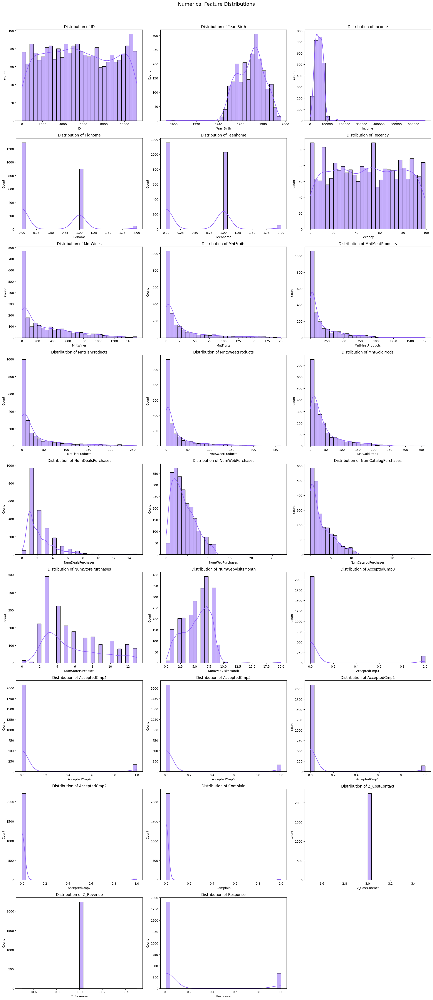

In [17]:
# Plot distribution for numerical features
def plot_numerical_distributions(df, numerical_features):
    n = len(numerical_features)
    n_cols = 3
    n_rows = (n + n_cols - 1) // n_cols


    plt.figure(figsize=(20, n_rows * 5))
    # Looping through each feature
    for i, col in enumerate(numerical_features, 1):
        plt.subplot(n_rows, n_cols, i)
        sns.histplot(df[col], kde=True, bins=30, color='#8B5CF6')
        plt.title(f'Distribution of {col}')
        plt.xlabel(col)
        plt.tight_layout()

    plt.suptitle("Numerical Feature Distributions", fontsize=16, y=1.02)
    plt.show()

plot_numerical_distributions(personality_df, numerical_features)

## Feature Engineering our Numerical columns

In [18]:
# We calculate the customer's age using the most recent date in the dataset
print(f"Latest date in dataset: {latest_date}")
# This transforms 'Year_Birth' into a more intuitive and useful feature for analysis
personality_df["Age"] = latest_date.year - personality_df["Year_Birth"]

# Remove 'Year_Birth' as it's no longer needed after computing age
personality_df.drop(columns=["Year_Birth"], inplace=True)


#  Drop irrelevant or constant columns:
# 'ID' is a unique identifier and not useful for modeling
# 'Z_CostContact' and 'Z_Revenue' are constant columns with no variance and does not value-add to our model
personality_df.drop(columns=['ID', 'Z_CostContact', 'Z_Revenue'], inplace=True)

# ✅ Confirm the remaining columns in the dataset
print("Remaining columns:", personality_df.columns.tolist())

Latest date in dataset: 2014-06-29 00:00:00
Remaining columns: ['Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'EducationLevel', 'CustomerTenure', 'Age']


In [19]:
# Here we analyze the proportion of values in the 'Complain' column
personality_df["Complain"].value_counts(normalize=True)

Complain
0    0.990625
1    0.009375
Name: proportion, dtype: float64

In [20]:
# We drop the 'Complain' column due to extreme imbalance (only ~0.9% are 1s)
# Such imbalance makes it non-informative for clustering or segmentation
personality_df.drop(columns=["Complain"], inplace=True)

In [21]:
# Calculate total spending across all product categories
spend_cols = [
    "MntWines", "MntFruits", "MntMeatProducts",
    "MntFishProducts", "MntSweetProducts", "MntGoldProds"
]
personality_df["TotalSpent"] = personality_df[spend_cols].sum(axis=1)


# Calculate total number of purchases across all channels
purchase_cols = [
    "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases", 
    "NumStorePurchases"
]
personality_df["TotalPurchases"] = personality_df[purchase_cols].sum(axis=1)


# Calculate total number of campaigns the customer accepted
campaign_cols = ["AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5"]
personality_df["TotalCampaignsAccepted"] = personality_df[campaign_cols].sum(axis=1)

In [22]:
# Calculate total number of children at home (kids + teens)
personality_df["TotalChildren"] = personality_df["Kidhome"] + personality_df["Teenhome"]

# Drop the original 'Kidhome' and 'Teenhome' columns to avoid redundancy
personality_df.drop(columns=["Kidhome", "Teenhome"], inplace=True)

# Create a binary flag for whether the customer has children
# 1 = parent, 0 = no children
personality_df["IsParent"] = (personality_df["TotalChildren"] > 0).astype(int)

# Estimate number of adults in the household based on marital status
# Logic: if living as a couple (With Partner), assume 2 adults; else 1
def estimate_adults(status):
    if status == "With Partner":
        return 2
    else:
        return 1

# Apply the adult estimation logic
personality_df["Adults"] = personality_df["Marital_Status"].apply(estimate_adults)

# Calculate total family size by summing estimated adults and total children
personality_df["FamilySize"] = personality_df["Adults"] + personality_df["TotalChildren"]

# Drop intermediate 'Adults' column to keep dataset tidy
personality_df.drop(columns=["Adults"], inplace=True)

In [23]:
# Quick check of dataset
personality_df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Marital_Status          2240 non-null   object 
 1   Income                  2240 non-null   float64
 2   Recency                 2240 non-null   int64  
 3   MntWines                2240 non-null   int64  
 4   MntFruits               2240 non-null   int64  
 5   MntMeatProducts         2240 non-null   int64  
 6   MntFishProducts         2240 non-null   int64  
 7   MntSweetProducts        2240 non-null   int64  
 8   MntGoldProds            2240 non-null   int64  
 9   NumDealsPurchases       2240 non-null   int64  
 10  NumWebPurchases         2240 non-null   int64  
 11  NumCatalogPurchases     2240 non-null   int64  
 12  NumStorePurchases       2240 non-null   int64  
 13  NumWebVisitsMonth       2240 non-null   int64  
 14  AcceptedCmp3            2240 non-null   

C:\Users\User\AppData\Local\Temp\ipykernel_4072\3982608766.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=personality_df, palette=count_palette, ax=ax)
C:\Users\User\AppData\Local\Temp\ipykernel_4072\3982608766.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=personality_df, palette=count_palette, ax=ax)
C:\Users\User\AppData\Local\Temp\ipykernel_4072\3982608766.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=personality_df, palette=count_palette, ax=ax)
C:\Users\User\AppData\Local\Tem

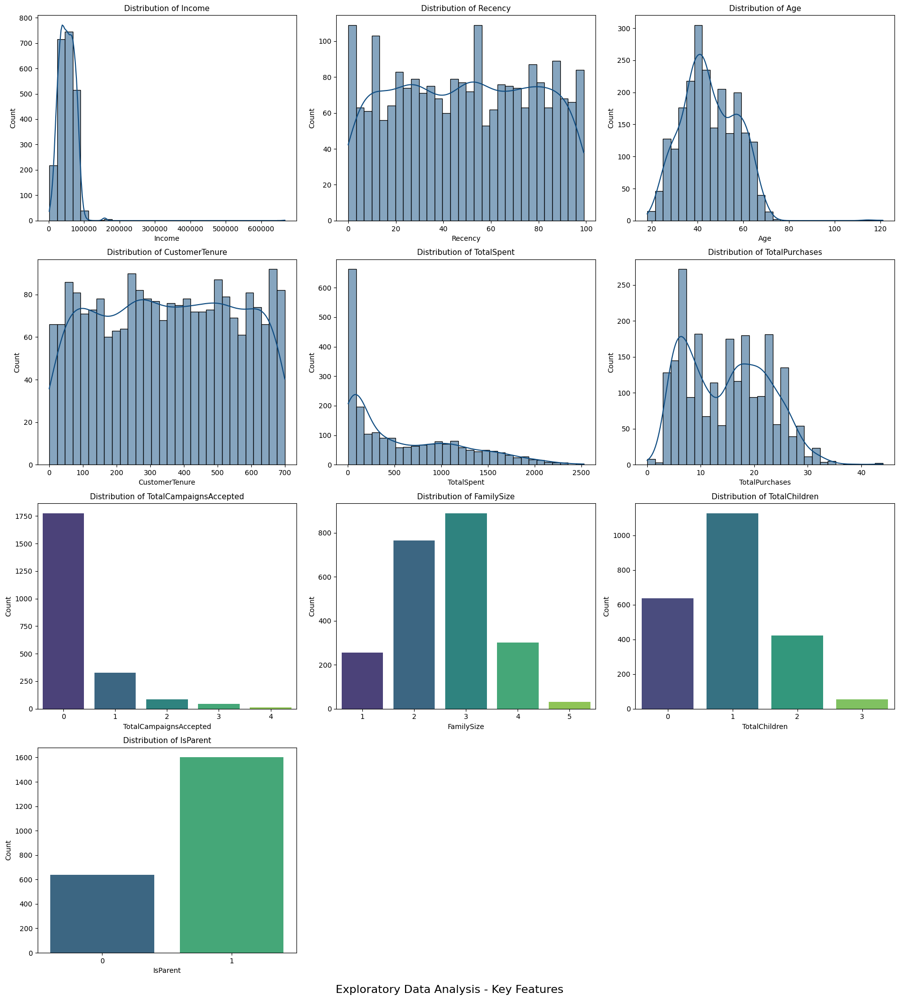

In [24]:
# Define key features
selected_features = [
    "Income", "Recency", "Age", "CustomerTenure", "TotalSpent",
    "TotalPurchases", "TotalCampaignsAccepted", "FamilySize",
    "TotalChildren", "IsParent"
]

n = len(selected_features)
n_cols = 3
n_rows = (n + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5))
axes = axes.flatten()  # Flatten the axes array for easy indexing

# Define colors
hist_color = '#0F4C81'
count_palette = 'viridis'

# Plot each feature
for i, col in enumerate(selected_features):
    ax = axes[i]
    if personality_df[col].nunique() <= 10:
        sns.countplot(x=col, data=personality_df, palette=count_palette, ax=ax)
    else:
        sns.histplot(personality_df[col], bins=30, kde=True, color=hist_color, ax=ax)
    ax.set_title(f'Distribution of {col}', fontsize=11)
    ax.set_xlabel(col)
    ax.set_ylabel("Count")

# Remove empty subplots if any
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout without overlapping title
plt.tight_layout()

# Add title at the **bottom** of the entire figure
fig.subplots_adjust(bottom=0.05)
fig.text(0.5, 0.01, "Exploratory Data Analysis - Key Features", ha='center', fontsize=16)

plt.show()


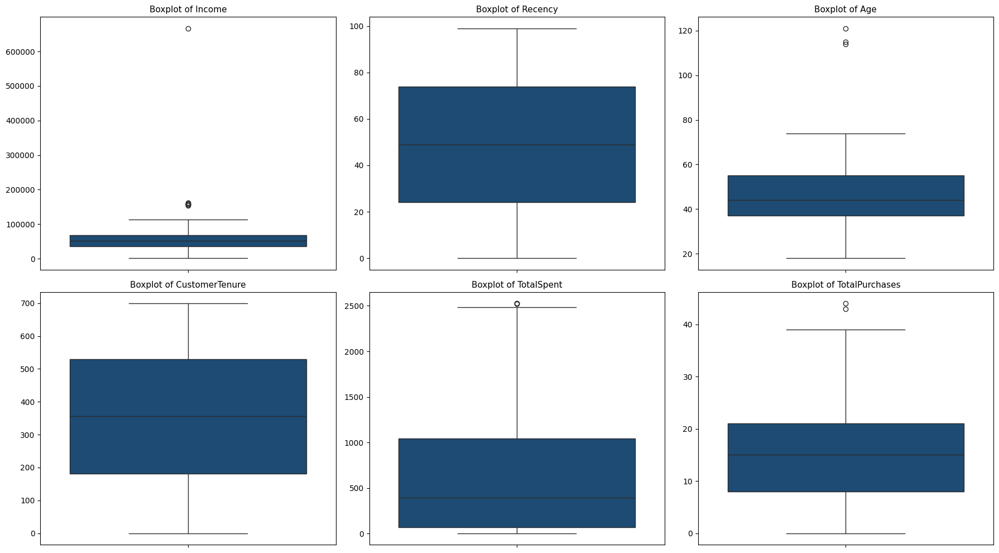

In [25]:
# Refined list of continuous features for outlier visualization and detection
outlier_features = [
    "Income", "Recency", "Age", "CustomerTenure",
    "TotalSpent", "TotalPurchases"
]


# Visualize numerical feature outliers using boxplots
def plot_boxplots(df, numerical_features):
    n = len(numerical_features)
    n_cols = 3
    n_rows = (n + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5))
    axes = axes.flatten()

    for i, col in enumerate(numerical_features):
        sns.boxplot(y=df[col], ax=axes[i], color='#0F4C81')
        axes[i].set_title(f'Boxplot of {col}', fontsize=11)
        axes[i].set_ylabel("")

    # Remove empty subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Call the boxplot function on your numerical features
plot_boxplots(personality_df, outlier_features)


In [26]:
def cap_outliers_iqr(df, features):
    df_capped = df.copy()

    for col in features:
        Q1 = df_capped[col].quantile(0.25)
        Q3 = df_capped[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Cap values above and below bounds
        df_capped[col] = np.where(df_capped[col] < lower_bound, lower_bound, df_capped[col])
        df_capped[col] = np.where(df_capped[col] > upper_bound, upper_bound, df_capped[col])

    return df_capped


In [27]:
# Define features where capping is meaningful
outlier_features = [
    "Income", "Recency", "Age", "CustomerTenure",
    "TotalSpent", "TotalPurchases"
]

# Apply the capping
personality_df = cap_outliers_iqr(personality_df, outlier_features)


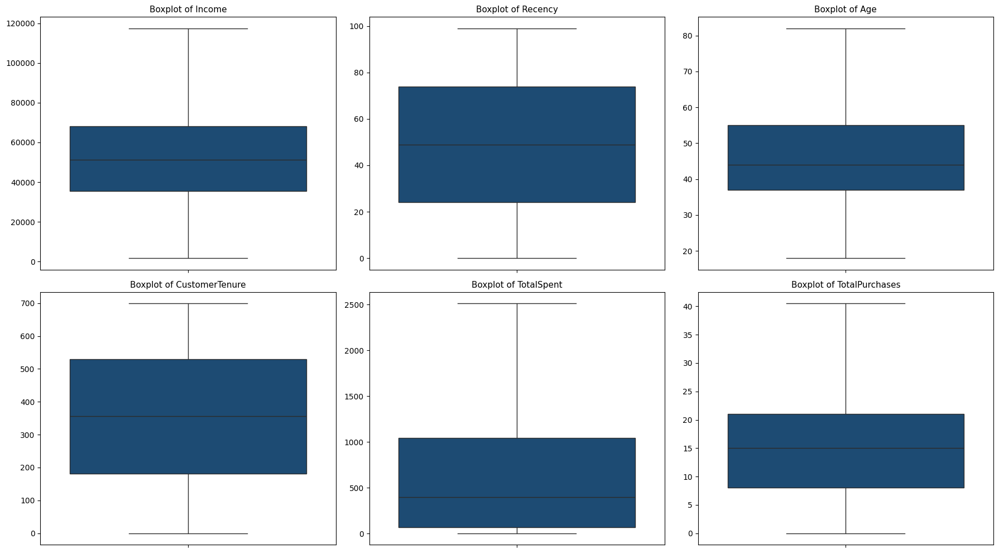

In [28]:
# Boxplot visualization after outlier capping
def plot_boxplots(df, numerical_features):
    n = len(numerical_features)
    n_cols = 3
    n_rows = (n + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5))
    axes = axes.flatten()

    for i, col in enumerate(numerical_features):
        sns.boxplot(y=df[col], ax=axes[i], color='#0F4C81')
        axes[i].set_title(f'Boxplot of {col}', fontsize=11)
        axes[i].set_ylabel("")

    # Remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Call the boxplot function
plot_boxplots(personality_df, outlier_features)


## Data Preprocessing

In [29]:
categorical_features = personality_df.select_dtypes(include=["object"]).columns.tolist()
categorical_features

['Marital_Status', 'EducationLevel']

In [30]:
# Define the order of education levels
edu_order = [["Undergraduate", "Graduate", "Postgraduate"]]

# Initialize encoder and apply to EducationLevel
encoder = OrdinalEncoder(categories=edu_order)
personality_df["EducationLevelEncoded"] = encoder.fit_transform(personality_df[["EducationLevel"]])


In [31]:
LE = LabelEncoder()
personality_df["Marital_Status"] = LE.fit_transform(personality_df["Marital_Status"])

In [32]:
# Automatically select all int and float features for clustering
cluster_features = personality_df.select_dtypes(include=["int64", "int32", "float64"]).columns.tolist()

In [33]:
X = personality_df[cluster_features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

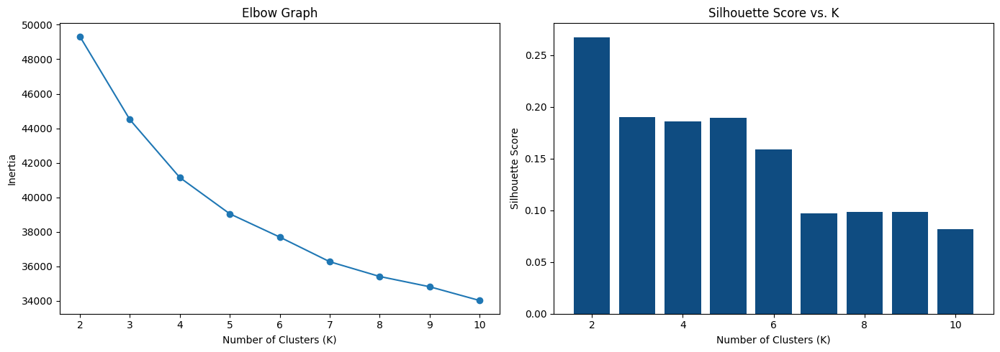

In [34]:
inertias = []
silhouette_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_scaled, kmeans.labels_))

# 📊 Plot Inertia and Silhouette Scores
plt.figure(figsize=(14, 5))

# Elbow plot
plt.subplot(1, 2, 1)
plt.plot(K_range, inertias, marker='o')
plt.title("Elbow Graph")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")

# Silhouette plot
plt.subplot(1, 2, 2)
plt.bar(K_range, silhouette_scores, color="#0F4C81")
plt.title("Silhouette Score vs. K")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")

plt.tight_layout()
plt.show()


In [35]:
# We deduce that our Optimal K is 4
optimal_k = 4  

kmeans = KMeans(n_clusters=optimal_k, random_state=42)
personality_df["Cluster_KMeans"] = kmeans.fit_predict(X_scaled)


## Agglomerative (Hierarchical) Clustering

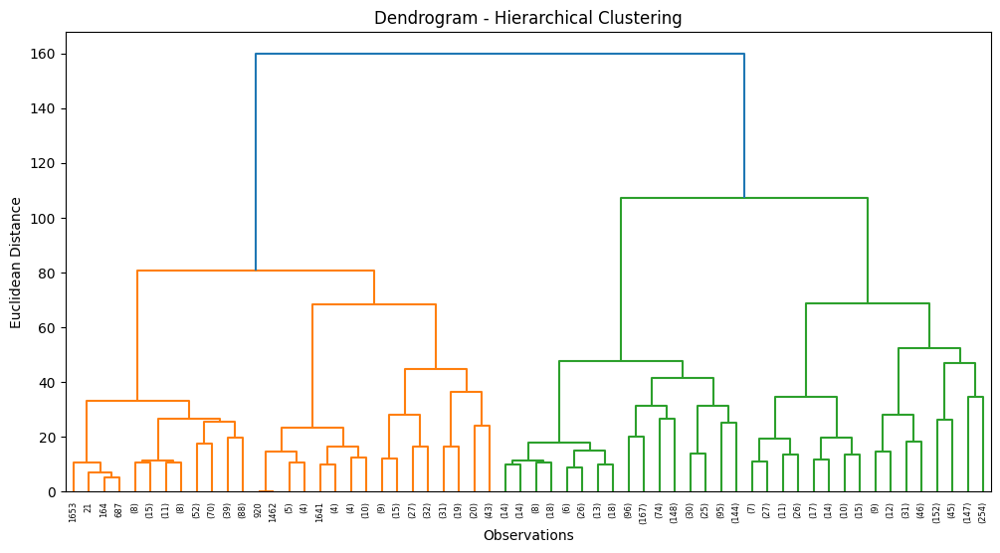

In [36]:
linked = linkage(X_scaled, method='ward')

plt.figure(figsize=(12, 6))
dendrogram(linked, truncate_mode='level', p=5)
plt.title("Dendrogram - Hierarchical Clustering")
plt.xlabel("Observations")
plt.ylabel("Euclidean Distance")
plt.show()


In [37]:
agg = AgglomerativeClustering(n_clusters= 4)  # We use the same n
personality_df["Cluster_Hierarchical"] = agg.fit_predict(X_scaled)


In [38]:
print("KMeans Silhouette Score:", silhouette_score(X_scaled, personality_df["Cluster_KMeans"]))
print("Agglomerative Silhouette Score:", silhouette_score(X_scaled, personality_df["Cluster_Hierarchical"]))

print("\nKMeans Cluster Sizes:\n", personality_df["Cluster_KMeans"].value_counts())
print("\nHierarchical Cluster Sizes:\n", personality_df["Cluster_Hierarchical"].value_counts())

KMeans Silhouette Score: 0.18617919153914747
Agglomerative Silhouette Score: 0.15193129322704918

KMeans Cluster Sizes:
 Cluster_KMeans
0    1038
2     602
3     452
1     148
Name: count, dtype: int64

Hierarchical Cluster Sizes:
 Cluster_Hierarchical
2    896
0    823
3    295
1    226
Name: count, dtype: int64


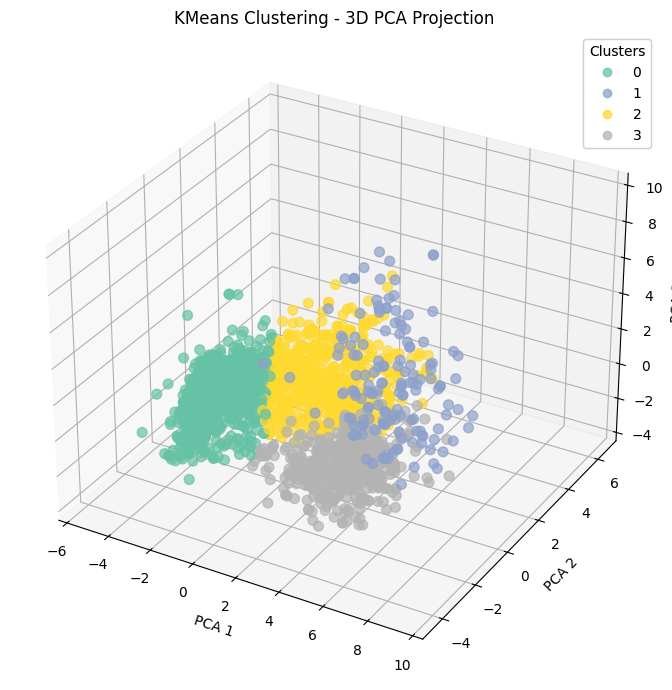

In [39]:
# Reduce dimensions to 3 for plotting
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)

# Add to DataFrame for plotting
pca_df = pd.DataFrame(X_pca_3d, columns=['PCA1', 'PCA2', 'PCA3'])
pca_df['Cluster_KMeans'] = personality_df['Cluster_KMeans']

# 3D Plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    pca_df['PCA1'], pca_df['PCA2'], pca_df['PCA3'],
    c=pca_df['Cluster_KMeans'], cmap='Set2', s=50, alpha=0.7
)

ax.set_title("KMeans Clustering - 3D PCA Projection")
ax.set_xlabel("PCA 1")
ax.set_ylabel("PCA 2")
ax.set_zlabel("PCA 3")
legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.tight_layout()
plt.show()

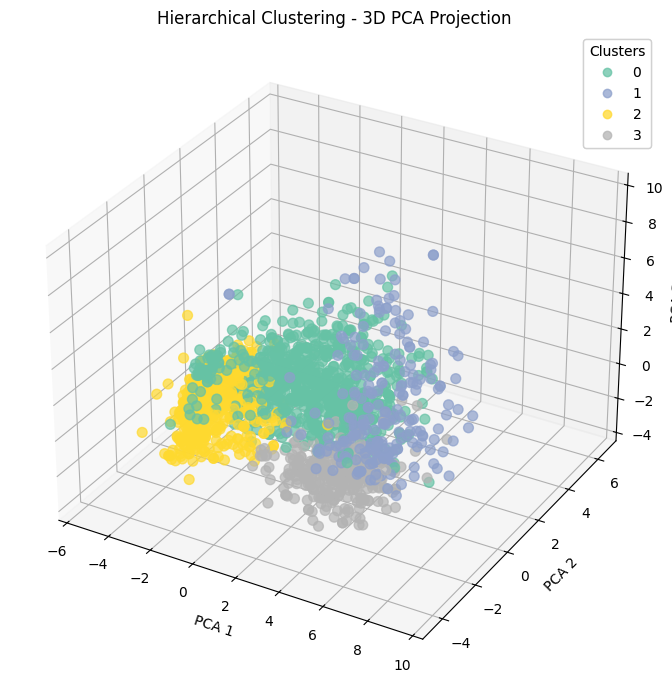

In [40]:
# Perform 3D PCA 
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)

# Step 2: Add PCA and cluster labels to a new DataFrame 
pca_df = pd.DataFrame(X_pca_3d, columns=['PCA1', 'PCA2', 'PCA3'])
pca_df['Cluster_Hierarchical'] = personality_df['Cluster_Hierarchical']

# Step 3: 3D Plot for Hierarchical Clusters 
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    pca_df['PCA1'], pca_df['PCA2'], pca_df['PCA3'],
    c=pca_df['Cluster_Hierarchical'], cmap='Set2', s=50, alpha=0.7
)

ax.set_title("Hierarchical Clustering - 3D PCA Projection")
ax.set_xlabel("PCA 1")
ax.set_ylabel("PCA 2")
ax.set_zlabel("PCA 3")

# Add legend
legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.tight_layout()
plt.show()


In [41]:
# Defining our final features for profiling 
profile_features = cluster_features

# Generate KMeans Cluster Profiles
kmeans_profile = personality_df.groupby("Cluster_KMeans")[profile_features].mean().T
print("\n KMeans Cluster Profile:")
display(kmeans_profile)

#Generate Hierarchical Cluster Profiles
hierarchical_profile = personality_df.groupby("Cluster_Hierarchical")[profile_features].mean().T
print("\n Hierarchical Cluster Profile:")
display(hierarchical_profile)



 KMeans Cluster Profile:


Cluster_KMeans,0,1,2,3
Marital_Status,0.645472,0.641892,0.684385,0.590708
Income,35171.384152,80231.672297,57671.171927,73184.356748
Recency,49.139692,48.567568,48.401993,50.159292
MntWines,40.855491,917.114865,451.593023,510.654867
MntFruits,4.905588,50.797297,24.044850,70.424779
MntMeatProducts,22.185934,436.020270,144.812292,440.776549
MntFishProducts,7.293834,74.439189,31.184385,103.309735
MntSweetProducts,4.980732,57.337838,25.327243,70.172566
MntGoldProds,15.248555,76.081081,62.096346,75.528761
NumDealsPurchases,1.974952,1.216216,3.973422,1.296460



 Hierarchical Cluster Profile:


Cluster_Hierarchical,0,1,2,3
Marital_Status,0.667072,0.676991,0.642857,0.562712
Income,55641.204739,79678.376106,34636.912667,72355.460169
Recency,47.939247,50.269912,49.898438,49.088136
MntWines,394.430134,811.464602,35.843750,476.925424
MntFruits,27.066829,55.513274,4.819196,67.040678
MntMeatProducts,137.832321,456.951327,21.175223,468.772881
MntFishProducts,35.085055,84.061947,7.498884,99.881356
MntSweetProducts,27.222357,63.973451,5.242188,64.616949
MntGoldProds,57.051033,77.774336,14.319196,72.030508
NumDealsPurchases,3.544350,1.150442,1.845982,1.277966


# Regression Analysis: Estimating Life Expectancy Using Socioeconomic and Health Indicators
Link to database: https://www.kaggle.com/datasets/lashagoch/life-expectancy-who-updated

In [42]:
# Data Handling
import pandas as pd
import numpy as np

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocessing
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Regression Models
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# Evaluation Metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Additional tools
from sklearn.inspection import permutation_importance
from sklearn.model_selection import cross_val_predict

In [43]:
#Loading in the dataset 
life_df = pd.read_csv("Life-Expectancy-Data-Updated.csv")
life_df.head()

,Country,Region,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,...,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
0,Turkiye,Middle East,2015,11.1,13.0,105.8240,1.32,97,65,27.8,...,97,0.08,11006,78.53,4.9,4.8,7.8,0,1,76.5
1,Spain,European Union,2015,2.7,3.3,57.9025,10.35,97,94,26.0,...,97,0.09,25742,46.44,0.6,0.5,9.7,1,0,82.8
2,India,Asia,2007,51.5,67.9,201.0765,1.57,60,35,21.2,...,64,0.13,1076,1183.21,27.1,28.0,5.0,0,1,65.4
3,Guyana,South America,2006,32.8,40.5,222.1965,5.68,93,74,25.3,...,93,0.79,4146,0.75,5.7,5.5,7.9,0,1,67.0
4,Israel,Middle East,2012,3.4,4.3,57.9510,2.89,97,89,27.0,...,94,0.08,33995,7.91,1.2,1.1,12.8,1,0,81.7


In [44]:
# Viewing the columns in our dataset
life_df.columns

Index(['Country', 'Region', 'Year', 'Infant_deaths', 'Under_five_deaths',
       'Adult_mortality', 'Alcohol_consumption', 'Hepatitis_B', 'Measles',
       'BMI', 'Polio', 'Diphtheria', 'Incidents_HIV', 'GDP_per_capita',
       'Population_mln', 'Thinness_ten_nineteen_years',
       'Thinness_five_nine_years', 'Schooling', 'Economy_status_Developed',
       'Economy_status_Developing', 'Life_expectancy'],
      dtype='object')

In [45]:
# Renaming the columns for simplicity and standardisation
life_df.rename(columns={
    'Country': 'country',
    'Region': 'region',
    'Year': 'year',
    'Infant_deaths': 'infant_deaths',
    'Under_five_deaths': 'under5_deaths',
    'Adult_mortality': 'adult_mortality',
    'Alcohol_consumption': 'alcohol',
    'Hepatitis_B': 'hepatitis_b',
    'Measles': 'measles',
    'BMI': 'bmi',
    'Polio': 'polio',
    'Diphtheria': 'diphtheria',
    'Incidents_HIV': 'hiv_aids',
    'GDP_per_capita': 'gdp',
    'Population_mln': 'population_mln',
    'Thinness_ten_nineteen_years': 'thin_10_19yrs',
    'Thinness_five_nine_years': 'thin_5_9yrs',
    'Schooling': 'schooling',
    'Economy_status_Developed': 'economy_status_developed',
    'Economy_status_Developing': 'economy_status_developing',
    'Life_expectancy': 'life_expectancy'
}, inplace=True)

# Confirm rename
print(life_df.columns)


Index(['country', 'region', 'year', 'infant_deaths', 'under5_deaths',
       'adult_mortality', 'alcohol', 'hepatitis_b', 'measles', 'bmi', 'polio',
       'diphtheria', 'hiv_aids', 'gdp', 'population_mln', 'thin_10_19yrs',
       'thin_5_9yrs', 'schooling', 'economy_status_developed',
       'economy_status_developing', 'life_expectancy'],
      dtype='object')


In [46]:
# Checking on the information of the dataset and the shape as well
life_df.info()
life_df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2864 entries, 0 to 2863
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   country                    2864 non-null   object 
 1   region                     2864 non-null   object 
 2   year                       2864 non-null   int64  
 3   infant_deaths              2864 non-null   float64
 4   under5_deaths              2864 non-null   float64
 5   adult_mortality            2864 non-null   float64
 6   alcohol                    2864 non-null   float64
 7   hepatitis_b                2864 non-null   int64  
 8   measles                    2864 non-null   int64  
 9   bmi                        2864 non-null   float64
 10  polio                      2864 non-null   int64  
 11  diphtheria                 2864 non-null   int64  
 12  hiv_aids                   2864 non-null   float64
 13  gdp                        2864 non-null   int64

(2864, 21)

In [47]:
# Summary statistics for all numeric columns
desc_stats = life_df.describe().T
desc_stats['skew'] = life_df[desc_stats.index].skew()
desc_stats[['mean', 'std', 'min', '25%', '50%', '75%', 'max', 'skew']]

,mean,std,min,25%,50%,75%,max,skew
year,2007.500000,4.610577,2000.000,2003.75000,2007.5000,2011.250000,2015.0000,0.000000
infant_deaths,30.363792,27.538117,1.800,8.10000,19.6000,47.350000,138.1000,1.104122
under5_deaths,42.938268,44.569974,2.300,9.67500,23.1000,66.000000,224.9000,1.378054
adult_mortality,192.251775,114.910281,49.384,106.91025,163.8415,246.791375,719.3605,1.377683
alcohol,4.820882,3.981949,0.000,1.20000,4.0200,7.777500,17.8700,0.571192
hepatitis_b,84.292598,15.995511,12.000,78.00000,89.0000,96.000000,99.0000,-1.658973
measles,77.344972,18.659693,10.000,64.00000,83.0000,93.000000,99.0000,-0.994008
bmi,25.032926,2.193905,19.800,23.20000,25.5000,26.400000,32.1000,-0.121106
polio,86.499651,15.080365,8.000,81.00000,93.0000,97.000000,99.0000,-1.726452
diphtheria,86.271648,15.534225,16.000,81.00000,93.0000,97.000000,99.0000,-1.826928


In [48]:
# Checking for null values in our dataset
life_df.isnull().sum()

country                      0
region                       0
year                         0
infant_deaths                0
under5_deaths                0
adult_mortality              0
alcohol                      0
hepatitis_b                  0
measles                      0
bmi                          0
polio                        0
diphtheria                   0
hiv_aids                     0
gdp                          0
population_mln               0
thin_10_19yrs                0
thin_5_9yrs                  0
schooling                    0
economy_status_developed     0
economy_status_developing    0
life_expectancy              0
dtype: int64

In [49]:
# Checking for duplicate values in our dataset
life_df.duplicated().sum()

0

## Feature Distributions and Skewness Analysis
We visualize the distribution and skewness of numerical features to detect potential transformation needs for normality and model performance.

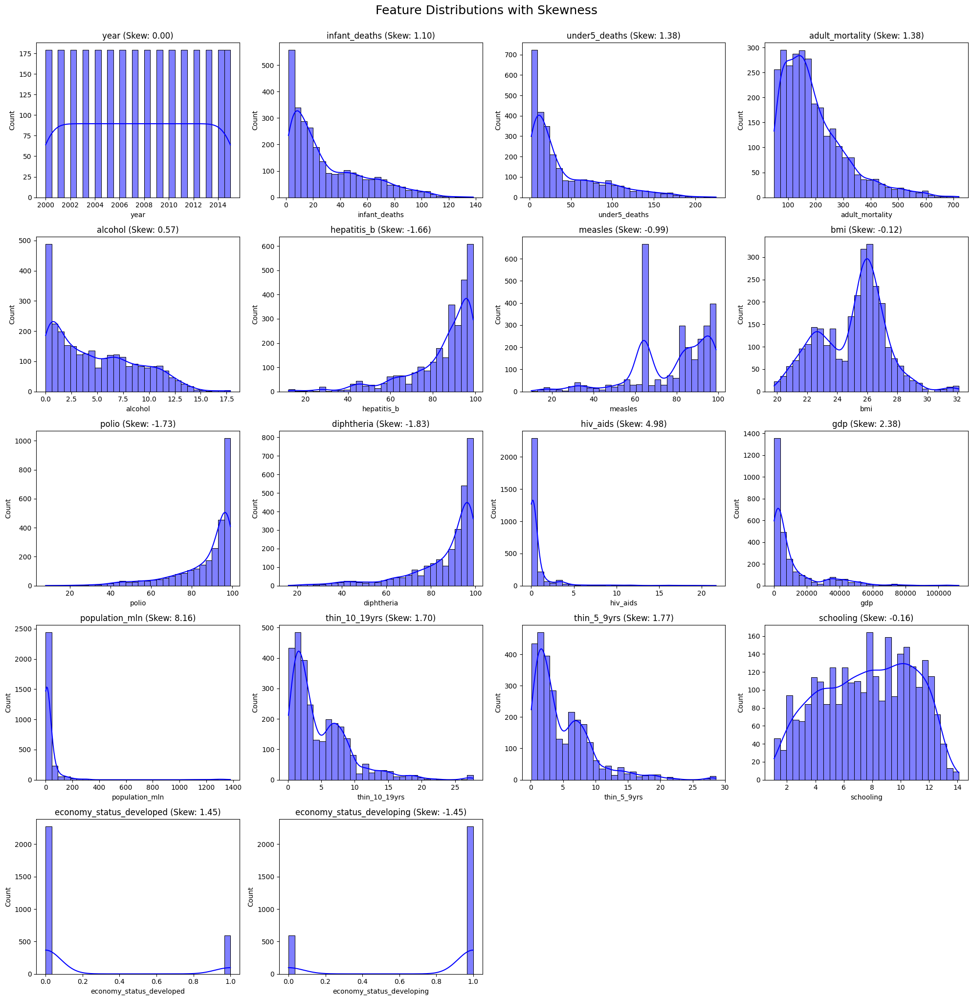

In [50]:
numerical_cols = life_df.select_dtypes(include=['float64', 'int64']).columns.drop('life_expectancy')

plt.figure(figsize=(20, 20))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 4, i)
    sns.histplot(life_df[col], kde=True, bins=30, color='blue')
    plt.title(f"{col} (Skew: {life_df[col].skew():.2f})")
plt.tight_layout()
plt.suptitle("Feature Distributions with Skewness", fontsize=18, y=1.02)
plt.show()

## Outlier Detection & Treatment
     Most numerical features exhibit right skewness, which will be addressed through log transformation and outlier treatment to improve model robustness.

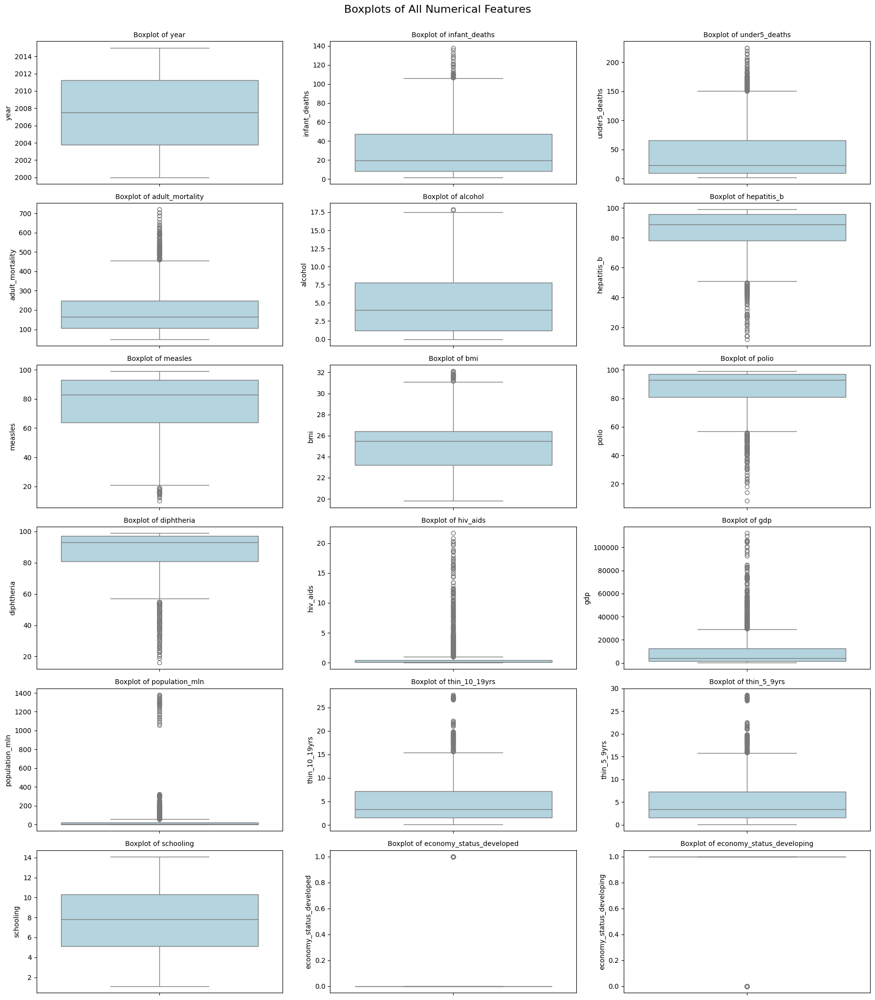

In [51]:
plt.figure(figsize=(18, 20))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(6, 3, i)
    sns.boxplot(y=life_df[col], color='Lightblue')
    plt.title(f"Boxplot of {col}", fontsize=10)
    plt.tight_layout()

plt.suptitle("Boxplots of All Numerical Features", fontsize=16, y=1.02)
plt.show()

In [52]:
# Detect outliers using IQR for each numerical feature
for col in numerical_cols:
    Q1 = life_df[col].quantile(0.25)
    Q3 = life_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_count = ((life_df[col] < lower_bound) | (life_df[col] > upper_bound)).sum()
    print(f"{col}: {outlier_count} outliers")

year: 0 outliers
infant_deaths: 29 outliers
under5_deaths: 102 outliers
adult_mortality: 112 outliers
alcohol: 2 outliers
hepatitis_b: 164 outliers
measles: 35 outliers
bmi: 25 outliers
polio: 190 outliers
diphtheria: 187 outliers
hiv_aids: 461 outliers
gdp: 425 outliers
population_mln: 362 outliers
thin_10_19yrs: 89 outliers
thin_5_9yrs: 95 outliers
schooling: 0 outliers
economy_status_developed: 592 outliers
economy_status_developing: 592 outliers


## Log Transformation & Outlier Capping
Log-transformed highly skewed features and applied IQR-based capping to reduce the impact of extreme outliers on model performance

In [53]:
# Features to log-transform
log_features = [
    'gdp', 'population_mln', 'hiv_aids', 'adult_mortality',
    'infant_deaths', 'under5_deaths', 'thin_10_19yrs', 'thin_5_9yrs'
]

# Apply log1p transformation
for col in log_features:
    life_df[f'log_{col}'] = np.log1p(life_df[col])

In [54]:
def cap_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    df[col] = df[col].clip(lower, upper)
    return df


In [55]:
# Apply to log-transformed columns
for col in log_features:
    cap_outliers_iqr(life_df, f'log_{col}')

# Additional continuous features that need capping but not log
cap_only_features = ['alcohol', 'schooling', 'bmi', 'measles']

for col in cap_only_features:
    cap_outliers_iqr(life_df, col)

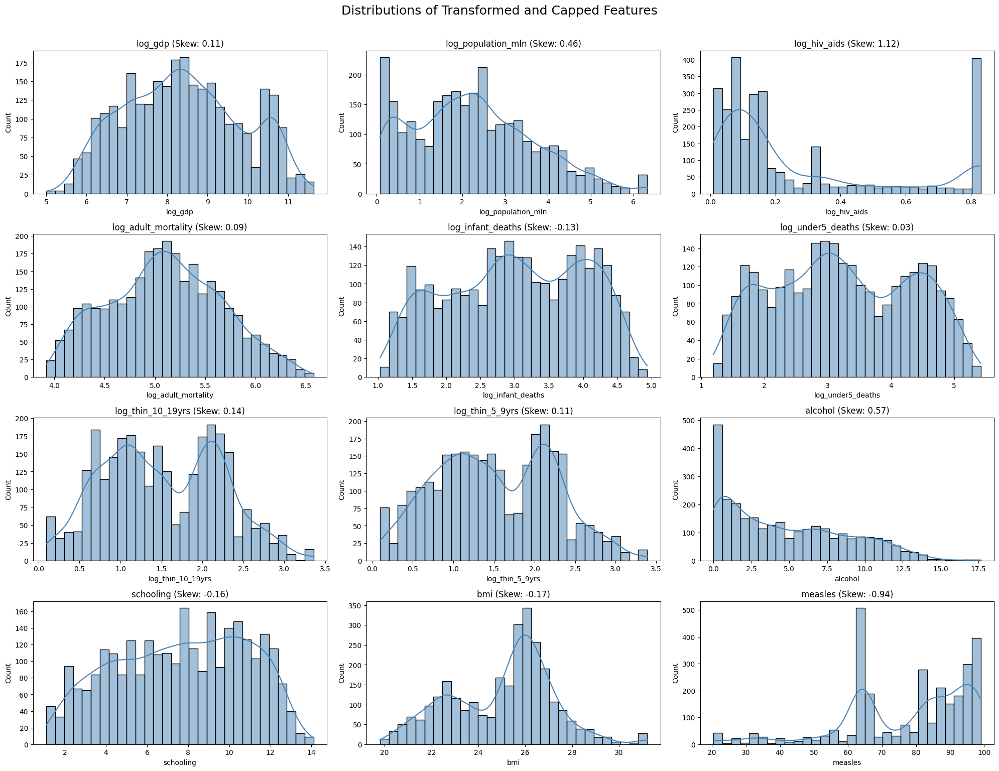

In [56]:
# Log-transformed features (post-capping)
log_transformed_cols = [f'log_{col}' for col in [
    'gdp', 'population_mln', 'hiv_aids', 'adult_mortality',
    'infant_deaths', 'under5_deaths', 'thin_10_19yrs', 'thin_5_9yrs'
]]

# Features that were only capped
cap_only_cols = ['alcohol', 'schooling', 'bmi', 'measles']

# Combine for plotting
final_features_to_plot = log_transformed_cols + cap_only_cols

# Plot
plt.figure(figsize=(20, 18))
for i, col in enumerate(final_features_to_plot, 1):
    plt.subplot(5, 3, i)
    sns.histplot(life_df[col], kde=True, bins=30, color='steelblue')
    plt.title(f"{col} (Skew: {life_df[col].skew():.2f})")

plt.tight_layout()
plt.suptitle("Distributions of Transformed and Capped Features", fontsize=18, y=1.03)
plt.show()

In [57]:
columns_to_drop = [
    'gdp', 'population_mln', 'hiv_aids', 'adult_mortality',
    'infant_deaths', 'under5_deaths', 'thin_10_19yrs', 'thin_5_9yrs'
]

life_df.drop(columns=columns_to_drop, inplace=True)


## Visualising our categorical features

C:\Users\User\AppData\Local\Temp\ipykernel_4072\1248535944.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=life_df, x=col, palette='pastel')


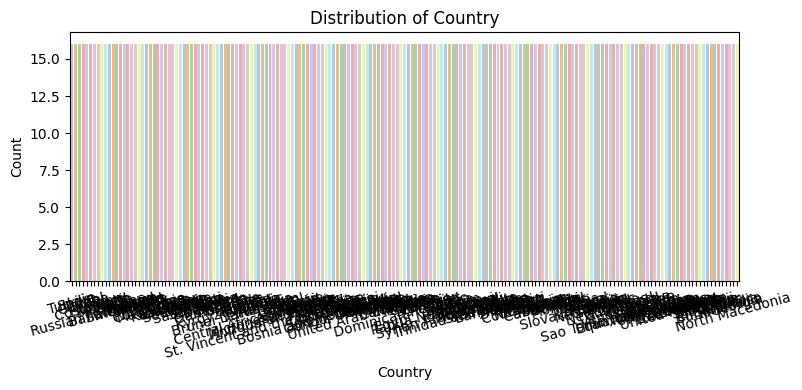

C:\Users\User\AppData\Local\Temp\ipykernel_4072\1248535944.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=life_df, x=col, palette='pastel')


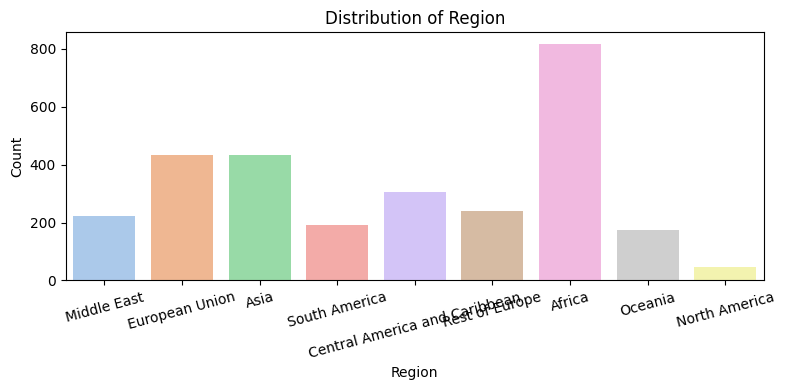

In [58]:
# Select categorical features by data type
categorical_cols = life_df.select_dtypes(include='object').columns.tolist()

# Plot each categorical column separately
for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=life_df, x=col, palette='pastel')
    plt.title(f"Distribution of {col.replace('_', ' ').title()}")
    plt.xlabel(col.replace('_', ' ').title())
    plt.ylabel("Count")
    plt.xticks(rotation=15)
    plt.tight_layout()
    plt.show()


In [59]:
# Drop redundant 'Country' columns
life_df.drop(columns=['country'], inplace=True)

## Exploratory Data Analysis (EDA)

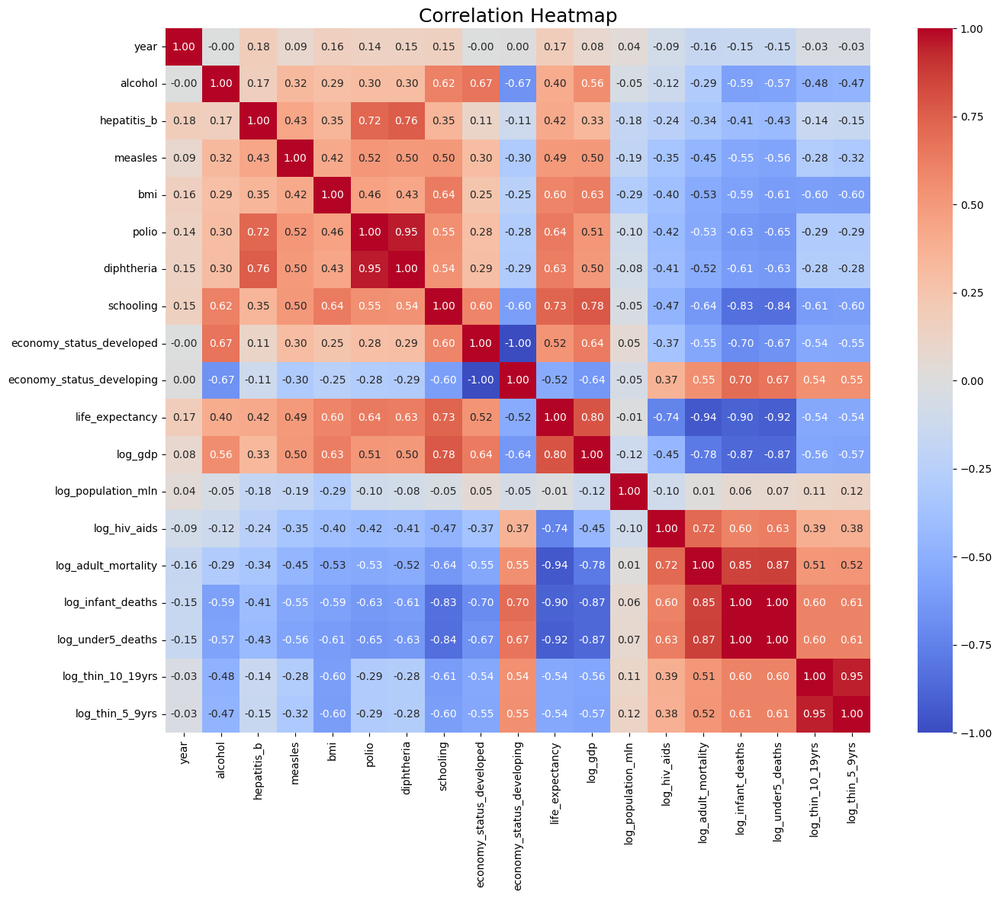

In [60]:
# Compute correlation matrix
plt.figure(figsize=(16, 12))
sns.heatmap(life_df.corr(numeric_only=True), annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.title("Correlation Heatmap", fontsize=18)
plt.show()

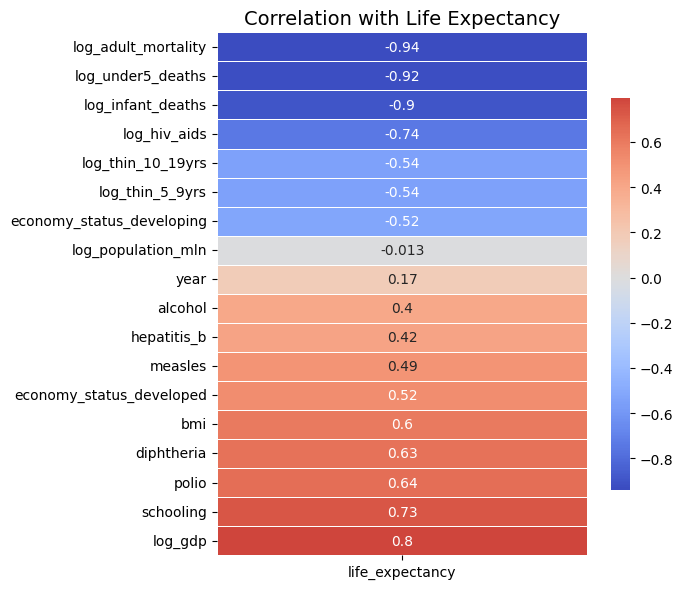

In [61]:
# Compute correlations
corr_with_target = life_df.corr(numeric_only=True)['life_expectancy'].drop('life_expectancy').sort_values()

# Plot
plt.figure(figsize=(7, 6))
sns.heatmap(corr_with_target.to_frame(), annot=True, cmap='coolwarm', center=0, linewidths=0.5, cbar_kws={"shrink": .75})
plt.title("Correlation with Life Expectancy", fontsize=14)
plt.tight_layout()
plt.show()


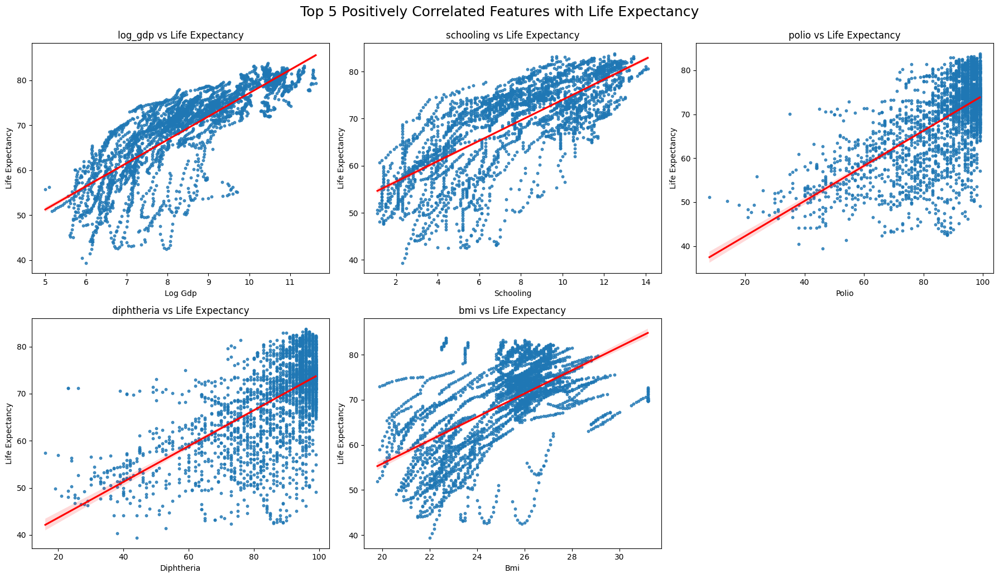

In [62]:
# Top 5 positively correlated features
top_pos_features = ['log_gdp', 'schooling', 'polio', 'diphtheria', 'bmi']

# Create subplots
plt.figure(figsize=(18, 10))
for idx, feature in enumerate(top_pos_features, 1):
    plt.subplot(2, 3, idx)
    sns.regplot(data=life_df, x=feature, y='life_expectancy', scatter_kws={'s': 10}, line_kws={'color': 'red'})
    plt.title(f"{feature} vs Life Expectancy")
    plt.xlabel(feature.replace('_', ' ').title())
    plt.ylabel("Life Expectancy")

plt.tight_layout()
plt.suptitle("Top 5 Positively Correlated Features with Life Expectancy", fontsize=18, y=1.03)
plt.show()


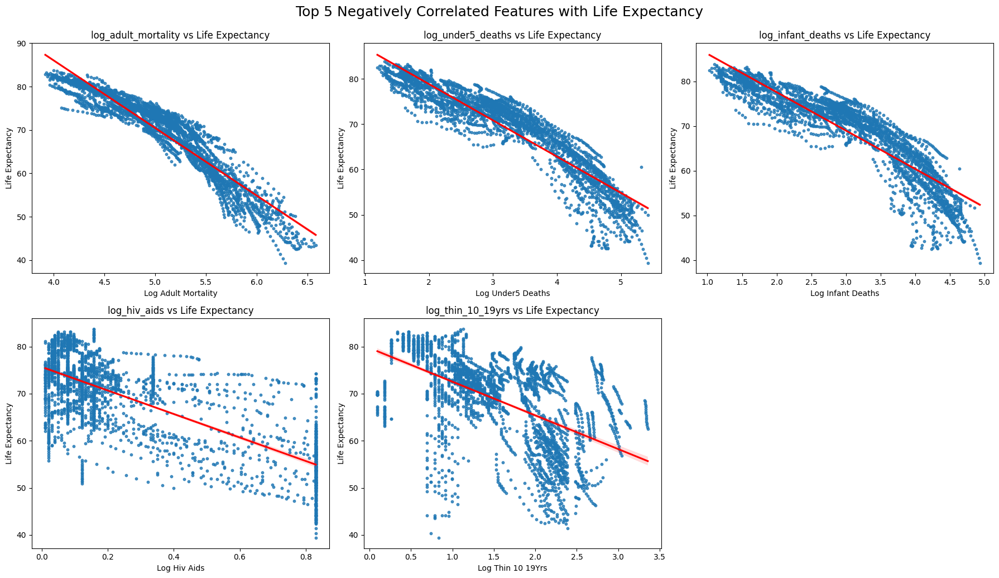

In [63]:
# Top 5 negatively correlated features
top_neg_features = ['log_adult_mortality', 'log_under5_deaths', 'log_infant_deaths', 'log_hiv_aids', 'log_thin_10_19yrs']

# Create subplots
plt.figure(figsize=(18, 10))
for idx, feature in enumerate(top_neg_features, 1):
    plt.subplot(2, 3, idx)
    sns.regplot(data=life_df, x=feature, y='life_expectancy', scatter_kws={'s': 10}, line_kws={'color': 'red'})
    plt.title(f"{feature} vs Life Expectancy")
    plt.xlabel(feature.replace('_', ' ').title())
    plt.ylabel("Life Expectancy")

plt.tight_layout()
plt.suptitle("Top 5 Negatively Correlated Features with Life Expectancy", fontsize=18, y=1.03)
plt.show()


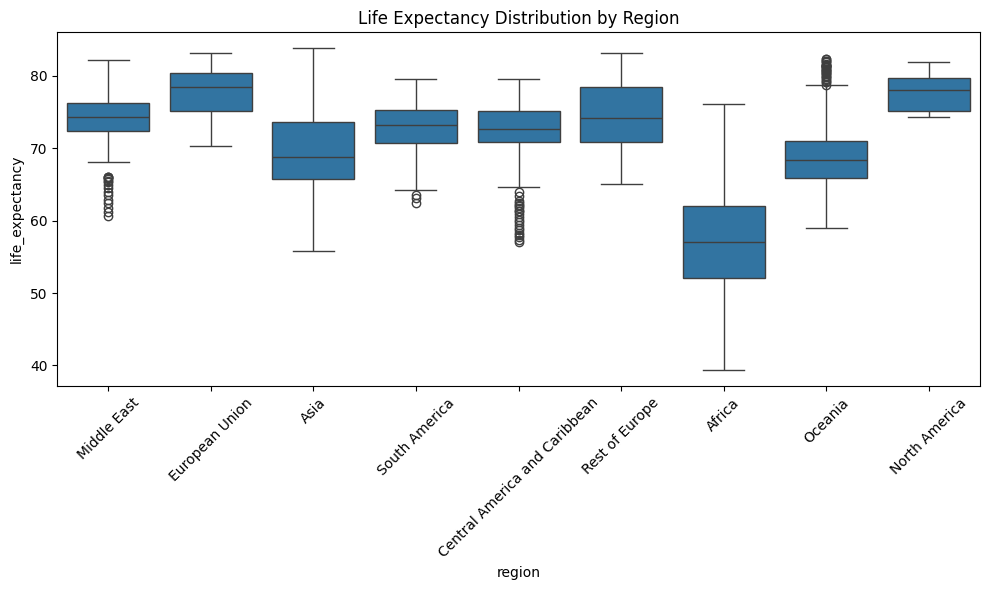

In [64]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=life_df, x='region', y='life_expectancy')
plt.xticks(rotation=45)
plt.title("Life Expectancy Distribution by Region")
plt.tight_layout()
plt.show()


## Data Preprocessing

In [65]:
# Separate features and target
X = life_df.drop("life_expectancy", axis=1)
y = life_df["life_expectancy"]

# One-hot encode region directly inside X
X = pd.get_dummies(X, columns=['region'], drop_first=True)

# Scale everything
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

In [66]:
# Define our Train and Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)


## Model Development, Evaluation, and Comparison

In [67]:
# Models dictionary
models = {
    'MLR': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Lasso Regression': Lasso(alpha=0.1),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42)
}

# Results dictionary
results = {}

# Evaluation loop
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2_test = r2_score(y_test, y_pred)
    cv_r2 = cross_val_score(model, X, y, cv=5, scoring='r2').mean()

    results[name] = {
        'MAE': mae,
        'RMSE': rmse,
        'R² (Test)': r2_test,
        'CV R² (5-fold)': cv_r2
    }

# Convert to DataFrame
results_df = pd.DataFrame(results).T.sort_values(by='CV R² (5-fold)', ascending=False)
results_df


,MAE,RMSE,R² (Test),CV R² (5-fold)
Random Forest,0.401128,0.553229,0.996432,0.996373
Gradient Boosting,0.656405,0.827265,0.992022,0.991265
MLR,1.156361,1.575016,0.971082,0.970991
Ridge Regression,1.180480,1.590367,0.970515,0.970674
Lasso Regression,1.333081,1.816956,0.961515,0.961800


In [68]:
def plot_diagnostics(model, model_name):
    # Fit and predict
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    residuals = y_test - y_pred

    # Plot style
    sns.set(style="whitegrid", font_scale=1.1)
    plt.figure(figsize=(14, 5))

    # Residuals Plot
    plt.subplot(1, 2, 1)
    sns.scatterplot(x=y_pred, y=residuals, color="#1f77b4", alpha=0.6, edgecolor=None)
    plt.axhline(0, linestyle='--', color='red', linewidth=1.2)
    plt.title(f"Residual Plot - {model_name}", fontsize=14)
    plt.xlabel("Predicted Life Expectancy")
    plt.ylabel("Residuals")

    # Actual vs Predicted Plot
    plt.subplot(1, 2, 2)
    sns.scatterplot(x=y_test, y=y_pred, color="#2ca02c", alpha=0.6, edgecolor=None)
    min_val = min(y_test.min(), y_pred.min())
    max_val = max(y_test.max(), y_pred.max())
    plt.plot([min_val, max_val], [min_val, max_val], '--', color='black', linewidth=1.2)
    plt.title(f"Prediction Accuracy - {model_name}", fontsize=14)
    plt.xlabel("Actual Life Expectancy")
    plt.ylabel("Predicted Life Expectancy")

    plt.suptitle(f"Diagnostic Plots for {model_name}", fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()


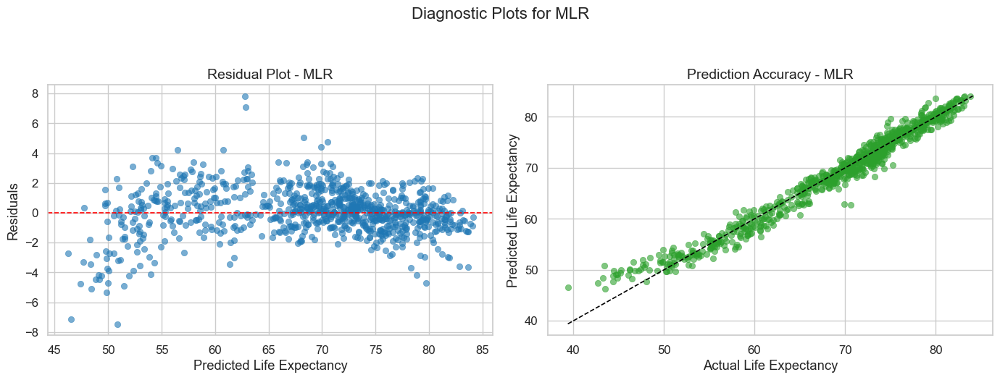

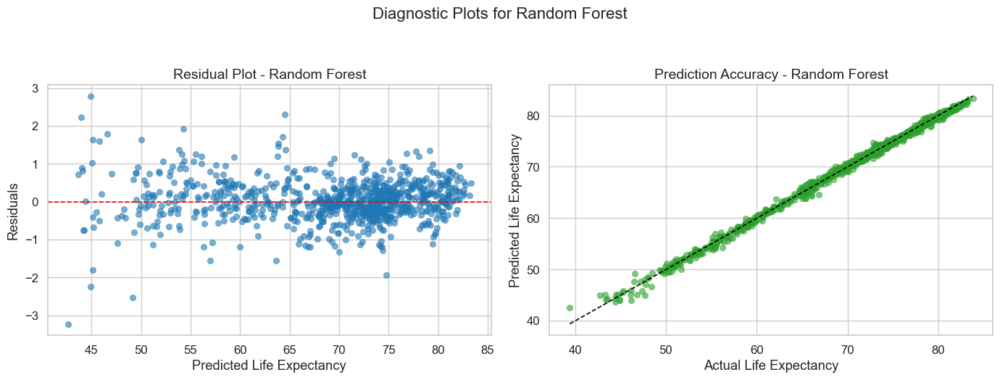

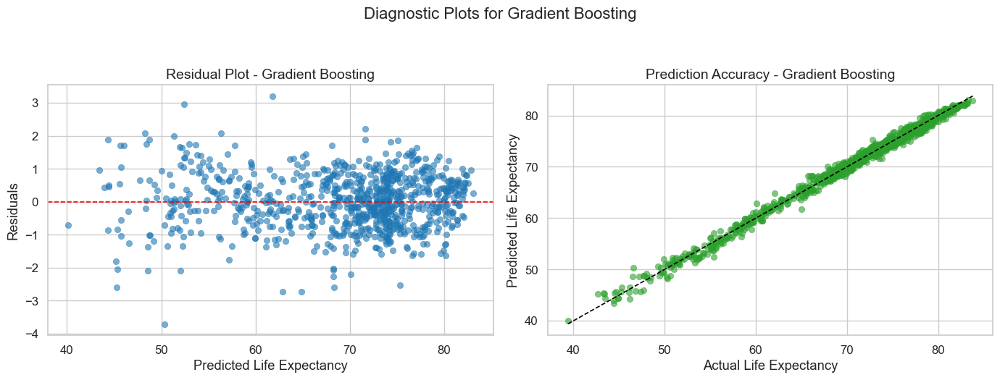

In [69]:
plot_diagnostics(LinearRegression(), "MLR")
plot_diagnostics(RandomForestRegressor(n_estimators=100, random_state=42), "Random Forest")
plot_diagnostics(GradientBoostingRegressor(n_estimators=100, random_state=42), "Gradient Boosting")


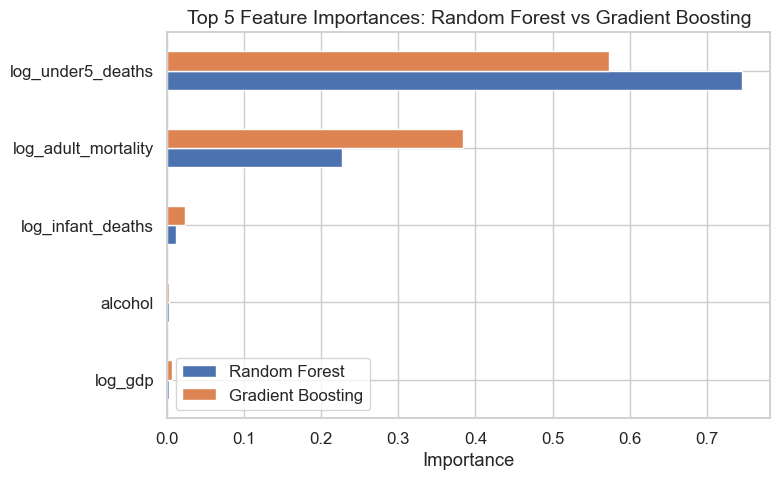

In [70]:
# Fit both models
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)

rf_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)

# Extract feature importances
rf_importances = pd.Series(rf_model.feature_importances_, index=X_train.columns)
gb_importances = pd.Series(gb_model.feature_importances_, index=X_train.columns)

# Combine into one dataframe
importance_df = pd.DataFrame({
    'Random Forest': rf_importances,
    'Gradient Boosting': gb_importances
})

# Get top 5 features by average importance
top_features = importance_df.mean(axis=1).sort_values(ascending=False).head(5).index
top_df = importance_df.loc[top_features]

# Plot horizontal bar chart
top_df.sort_values(by='Random Forest', ascending=True).plot(kind='barh', figsize=(8, 5))
plt.title("Top 5 Feature Importances: Random Forest vs Gradient Boosting", fontsize=14)
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

### Feature Refinement: Removing Dominant Predictors
After conducting feature importance analysis across Random Forest, Gradient Boosting, and examining MLR coefficients, it was evident that three features — log_under5_deaths, log_adult_mortality, and log_infant_deaths — had disproportionately strong influence on the prediction of life expectancy. While these variables are undeniably important, their overwhelming impact may mask the relative contributions of other meaningful features. To gain deeper insights into the subtler drivers of life expectancy, we excluded these three dominant predictors and retrained all models on the reduced feature set.



In [71]:
# Updated features (excluding log_under5_deaths, log_adult_mortality, log_infant_deaths)
features = [
    'log_gdp', 'log_population_mln', 'log_hiv_aids',
    'log_thin_10_19yrs', 'log_thin_5_9yrs', 'alcohol',
    'schooling', 'bmi', 'measles',
    'economy_status_developed', 'economy_status_developing', 'region'
]


In [72]:
# Target
y = life_df['life_expectancy']

# Build X with selected features
X = life_df[features]

# One-hot encode region
X = pd.get_dummies(X, columns=['region'], drop_first=True)

# Standardize
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)


In [73]:
# Defining our train/test split again
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

In [74]:
models = {
    'MLR': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Lasso Regression': Lasso(alpha=0.1),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42)
}

results = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2_test = r2_score(y_test, y_pred)
    cv_r2 = cross_val_score(model, X, y, cv=5, scoring='r2').mean()

    results[name] = {
        'MAE': mae,
        'RMSE': rmse,
        'R² (Test)': r2_test,
        'CV R² (5-fold)': cv_r2
    }

results_df = pd.DataFrame(results).T.sort_values(by='CV R² (5-fold)', ascending=False)
results_df


,MAE,RMSE,R² (Test),CV R² (5-fold)
Random Forest,0.666778,1.072097,0.986601,0.988094
Gradient Boosting,1.640240,2.223976,0.942342,0.941849
Ridge Regression,2.704317,3.650990,0.844610,0.853936
MLR,2.704270,3.651007,0.844608,0.853930
Lasso Regression,2.746043,3.707313,0.839779,0.849884


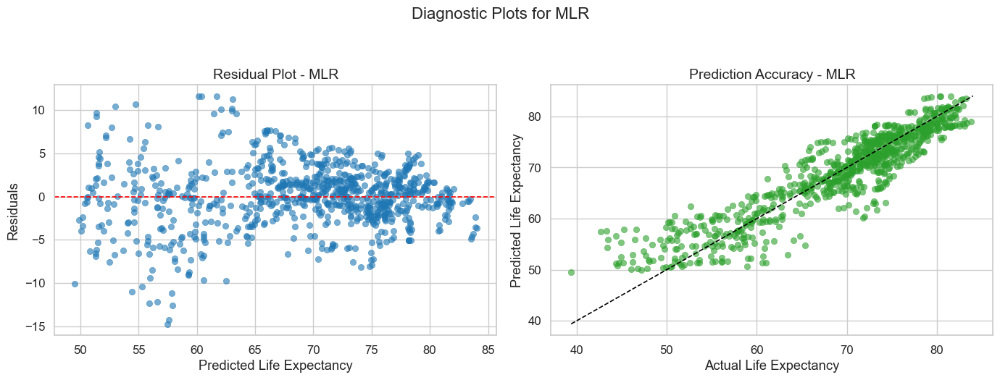

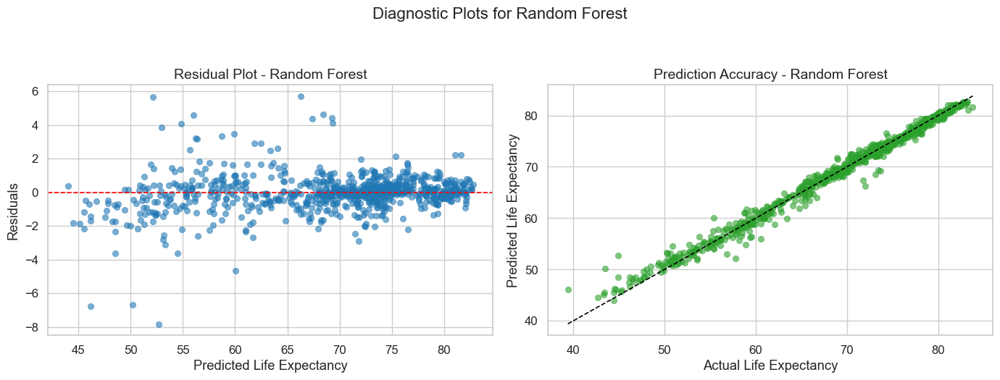

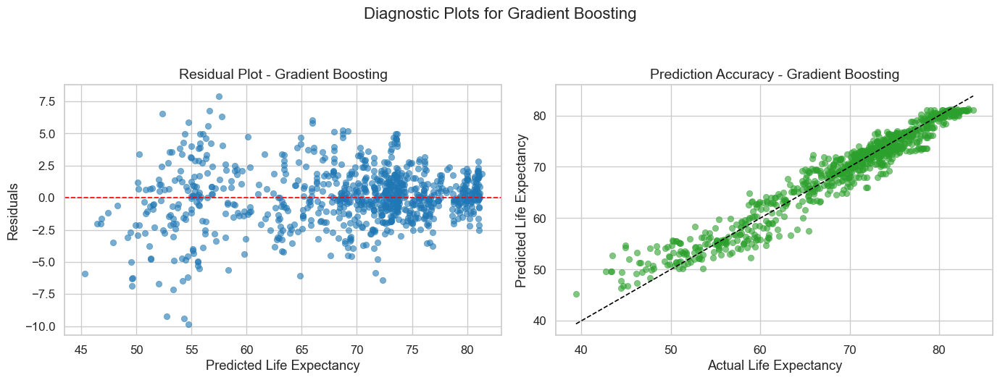

In [75]:
def plot_diagnostics(model, model_name):
    # Fit and predict
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    residuals = y_test - y_pred

    # Plot style
    sns.set(style="whitegrid", font_scale=1.1)
    plt.figure(figsize=(14, 5))

    # Residuals Plot
    plt.subplot(1, 2, 1)
    sns.scatterplot(x=y_pred, y=residuals, color="#1f77b4", alpha=0.6, edgecolor=None)
    plt.axhline(0, linestyle='--', color='red', linewidth=1.2)
    plt.title(f"Residual Plot - {model_name}", fontsize=14)
    plt.xlabel("Predicted Life Expectancy")
    plt.ylabel("Residuals")

    # Actual vs Predicted Plot
    plt.subplot(1, 2, 2)
    sns.scatterplot(x=y_test, y=y_pred, color="#2ca02c", alpha=0.6, edgecolor=None)
    min_val = min(y_test.min(), y_pred.min())
    max_val = max(y_test.max(), y_pred.max())
    plt.plot([min_val, max_val], [min_val, max_val], '--', color='black', linewidth=1.2)
    plt.title(f"Prediction Accuracy - {model_name}", fontsize=14)
    plt.xlabel("Actual Life Expectancy")
    plt.ylabel("Predicted Life Expectancy")

    plt.suptitle(f"Diagnostic Plots for {model_name}", fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()

# Example usage:
plot_diagnostics(LinearRegression(), "MLR")
plot_diagnostics(RandomForestRegressor(n_estimators=100, random_state=42), "Random Forest")
plot_diagnostics(GradientBoostingRegressor(n_estimators=100, random_state=42), "Gradient Boosting")

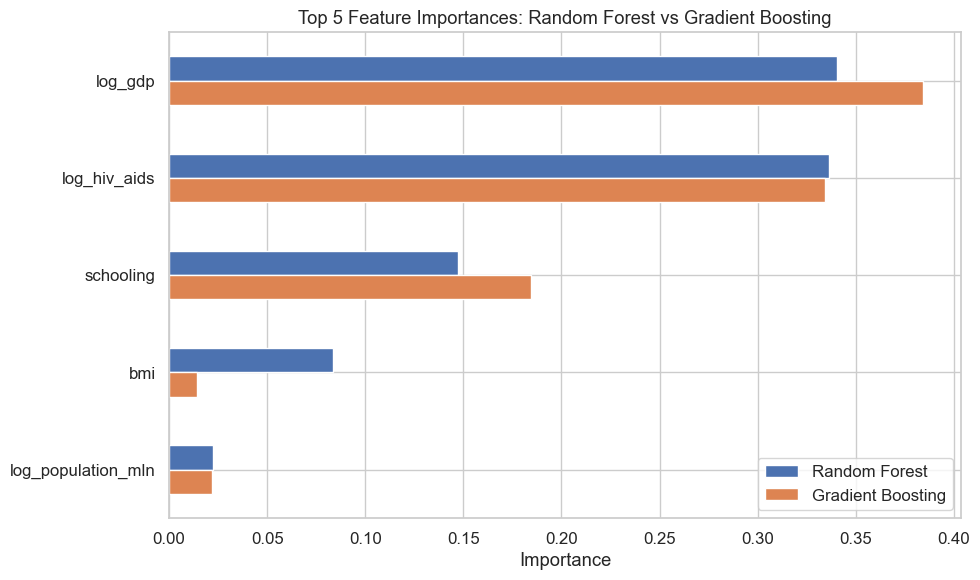

In [76]:
# Fit models
rf = RandomForestRegressor(n_estimators=100, random_state=42).fit(X_train, y_train)
gb = GradientBoostingRegressor(n_estimators=100, random_state=42).fit(X_train, y_train)

# Get importances
rf_importance = pd.Series(rf.feature_importances_, index=X_train.columns)
gb_importance = pd.Series(gb.feature_importances_, index=X_train.columns)

# Top 5 features
top_features = list(rf_importance.sort_values(ascending=False).head(5).index)

# Combine
importances_df = pd.DataFrame({
    'Random Forest': rf_importance[top_features],
    'Gradient Boosting': gb_importance[top_features]
})

# Plot
importances_df.plot(kind='barh', figsize=(10, 6))
plt.title("Top 5 Feature Importances: Random Forest vs Gradient Boosting")
plt.xlabel("Importance")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


C:\Users\User\AppData\Local\Temp\ipykernel_4072\2338027391.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=results_df_sorted.reset_index(), x='CV R² (5-fold)', y='index', palette='mako')


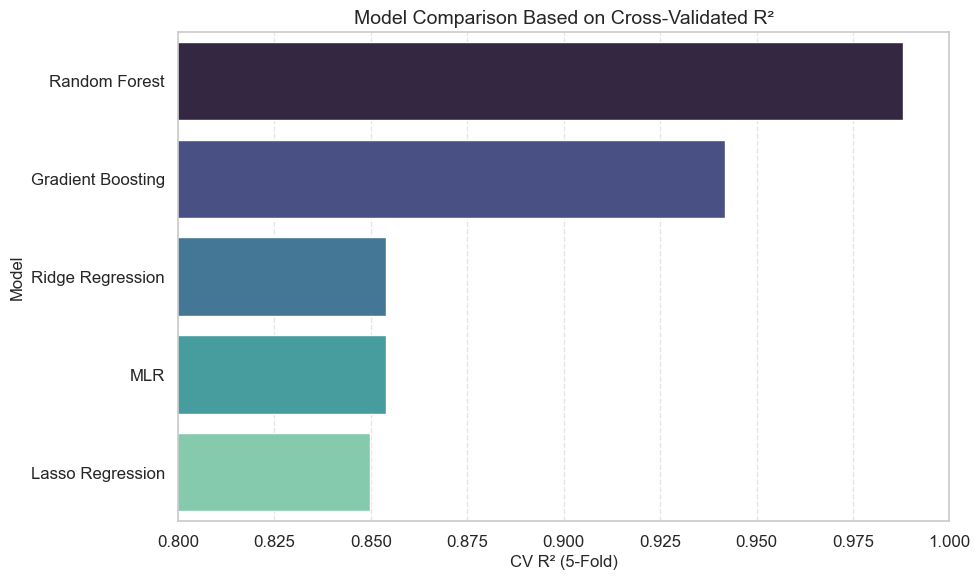

In [77]:
results_df_sorted = results_df.sort_values(by='CV R² (5-fold)', ascending=False)

# Barplot of CV R²
plt.figure(figsize=(10, 6))
sns.barplot(data=results_df_sorted.reset_index(), x='CV R² (5-fold)', y='index', palette='mako')
plt.title("Model Comparison Based on Cross-Validated R²", fontsize=14)
plt.xlabel("CV R² (5-Fold)", fontsize=12)
plt.ylabel("Model", fontsize=12)
plt.xlim(0.8, 1)
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


# Classification Analysis: Predicting Term Deposit Subscriptions Using Machine Learning
Link to dataset: https://archive.ics.uci.edu/dataset/222/bank+marketing (I used bank-additional-full.csv, there are multiple avaialble)

### Preparing Data

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Model selection & preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.tree import plot_tree, export_text

# Metrics and evaluation
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
    confusion_matrix, classification_report, RocCurveDisplay, PrecisionRecallDisplay
)

In [79]:
#Loading in the dataset 
bank_df = pd.read_csv("bank-additional-full.csv", sep = ";")
bank_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [80]:
# We rename 'y' our target variable to 'Subscribed' to make it more intuitive
bank_df.rename(columns={"y": "subscribed"}, inplace=True)
bank_df['subscribed'] = bank_df['subscribed'].map({'yes': 1, 'no': 0})
# Verify change
bank_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscribed
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0


In [81]:
# Checking on the information of the dataset and the shape as well
bank_df.info()
bank_df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

(41188, 21)

In [82]:
# We derive the summary statistics for our numerical features
bank_df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,41188.0,40.024060,10.421250,17.000,32.000,38.000,47.000,98.000
duration,41188.0,258.285010,259.279249,0.000,102.000,180.000,319.000,4918.000
campaign,41188.0,2.567593,2.770014,1.000,1.000,2.000,3.000,56.000
pdays,41188.0,962.475454,186.910907,0.000,999.000,999.000,999.000,999.000
previous,41188.0,0.172963,0.494901,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41188.0,0.081886,1.570960,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41188.0,93.575664,0.578840,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41188.0,-40.502600,4.628198,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41188.0,3.621291,1.734447,0.634,1.344,4.857,4.961,5.045
nr.employed,41188.0,5167.035911,72.251528,4963.600,5099.100,5191.000,5228.100,5228.100


In [83]:
# We now check for missing values
bank_df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
subscribed        0
dtype: int64

### We do not have any missing values but we have an 'Unknown' category in some of our features so we take a further look

In [84]:
# Identify columns containing "unknown" as a category
unknown_counts = {}

# Iterate through categorical columns and count occurrences of "unknown"
for col in bank_df.select_dtypes(include=["object"]).columns:
    unknown_count = (bank_df[col] == "unknown").sum()
    if unknown_count > 0:
        unknown_counts[col] = unknown_count

# Convert to DataFrame for easy readability
unknown_df = pd.DataFrame.from_dict(unknown_counts, orient="index", columns=["Count"])
unknown_df["Percentage"] = (unknown_df["Count"] / len(bank_df)) * 100

# Display results
print(unknown_df)

           Count  Percentage
job          330    0.801204
marital       80    0.194231
education   1731    4.202680
default     8597   20.872584
housing      990    2.403613
loan         990    2.403613


In [85]:
# Impute 'unknown' values in 'job' and 'marital' with their respective mode
for col in ['job', 'marital']:
    mode_val = bank_df[col].mode()[0]
    bank_df[col] = bank_df[col].replace('unknown', mode_val)

# Confirm that no 'unknown' remains in those two columns
for col in ['job', 'marital']:
    assert 'unknown' not in bank_df[col].unique(), f"'unknown' still found in {col}"

In [86]:
bank_df["default"].value_counts()

default
no         32588
unknown     8597
yes            3
Name: count, dtype: int64

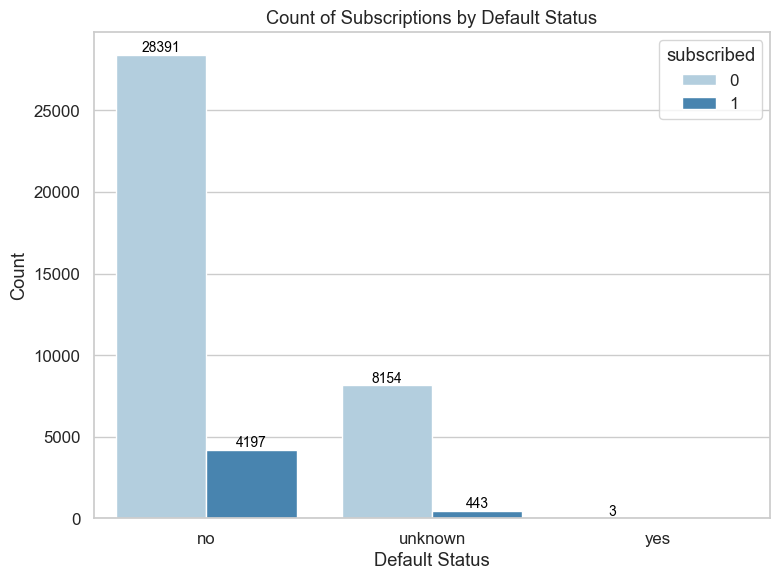

In [87]:
plt.figure(figsize=(8, 6))
ax = sns.countplot(data=bank_df, x="default", hue="subscribed", palette="Blues")

# Add labels on top of bars
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{int(height)}', (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=10, color='black')

plt.title("Count of Subscriptions by Default Status")
plt.xlabel("Default Status")
plt.ylabel("Count")
plt.xticks()
plt.tight_layout()
plt.show()

In [88]:
# We drop the 'yes' category in default as it is too insignificant to give us any meaningful predictions
bank_df = bank_df[bank_df['default'] != 'yes']
# We create a new column default_disclosed which is a binary indicator
bank_df['default_disclosed'] = bank_df['default'].apply(lambda x: 1 if x != 'unknown' else 0)

In [89]:
# Observing the counts of our binary column
bank_df["default_disclosed"].value_counts()

default_disclosed
1    32588
0     8597
Name: count, dtype: int64

In [90]:
# We drop the original default column as it is redundant
bank_df.drop(columns='default', inplace=True)

## Visualising our catergorial and numerical features 

In [91]:
# Categorical Features
categorical_features = bank_df.select_dtypes(include=["object"]).columns.tolist()

# Numerical Features
numerical_features = bank_df.select_dtypes(include=["int64", "float64"]).columns.tolist()

C:\Users\User\AppData\Local\Temp\ipykernel_4072\2288217825.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=bank_df, x=col, order=bank_df[col].value_counts().index, palette="Blues")
C:\Users\User\AppData\Local\Temp\ipykernel_4072\2288217825.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=bank_df, x=col, order=bank_df[col].value_counts().index, palette="Blues")
C:\Users\User\AppData\Local\Temp\ipykernel_4072\2288217825.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=bank_df, x=col, order=bank_df[col].value_c

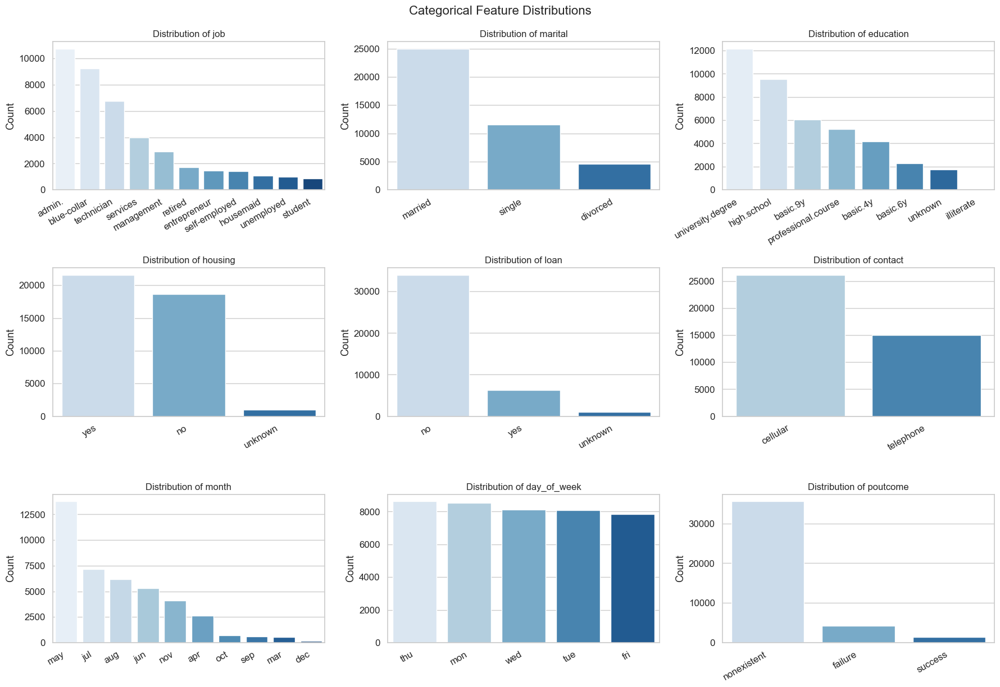

In [92]:
# Code to see how all the categorical features are distributed
n_cols = 3
n_rows = (len(categorical_features) + n_cols - 1) // n_cols

plt.figure(figsize=(n_cols * 6, n_rows * 4))

# Loop through and plot each feature
for idx, col in enumerate(categorical_features, 1):
    plt.subplot(n_rows, n_cols, idx)
    sns.countplot(data=bank_df, x=col, order=bank_df[col].value_counts().index, palette="Blues")
    plt.title(f"Distribution of {col}", fontsize=12)
    plt.xticks(rotation=30, ha="right")
    plt.xlabel("")
    plt.ylabel("Count")

plt.tight_layout()
plt.suptitle("Categorical Feature Distributions", fontsize=16, y=1.02)
plt.show()

## Feature engineering our categorical features


In [93]:
education_map = {
    'illiterate': 'Low',
    'basic.4y': 'Low',
    'basic.6y': 'Low',
    'basic.9y': 'Medium',
    'high.school': 'Medium',
    'professional.course': 'High',
    'university.degree': 'High',
    'unknown': 'Unknown'
}

bank_df["education"] = bank_df["education"].map(education_map)

In [94]:
bank_df["education"].value_counts()

education
High       17409
Medium     15559
Low         6486
Unknown     1731
Name: count, dtype: int64

In [95]:
# Define quarter mapping
quarter_mapping = {
    "jan": "Q1", "feb": "Q1", "mar": "Q1",
    "apr": "Q2", "may": "Q2", "jun": "Q2",
    "jul": "Q3", "aug": "Q3", "sep": "Q3",
    "oct": "Q4", "nov": "Q4", "dec": "Q4"
}

# Apply mapping
bank_df["quarter"] = bank_df["month"].map(quarter_mapping)

# Drop the original month column
bank_df.drop(columns=["month"], inplace=True)

In [96]:
bank_df["quarter"].value_counts()

quarter
Q2    21719
Q3    13920
Q4     5000
Q1      546
Name: count, dtype: int64

In [97]:
# Display original job distribution in percentages
job_percent = bank_df['job'].value_counts(normalize=True) * 100
job_percent = job_percent.round(2).rename_axis('job').reset_index(name='percentage')
print(job_percent)

              job  percentage
0          admin.       26.11
1     blue-collar       22.47
2      technician       16.37
3        services        9.64
4      management        7.10
5         retired        4.18
6    entrepreneur        3.54
7   self-employed        3.45
8       housemaid        2.57
9      unemployed        2.46
10        student        2.12


In [98]:
# Define major job categories
major_jobs = ['admin.', 'blue-collar', 'technician', 'services', 'management']

# Create new grouped job feature
bank_df['job'] = bank_df['job'].apply(lambda x: x if x in major_jobs else 'other')


C:\Users\User\AppData\Local\Temp\ipykernel_4072\2847221262.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y='job', x='percentage', data=job_percent, palette='Blues_d')


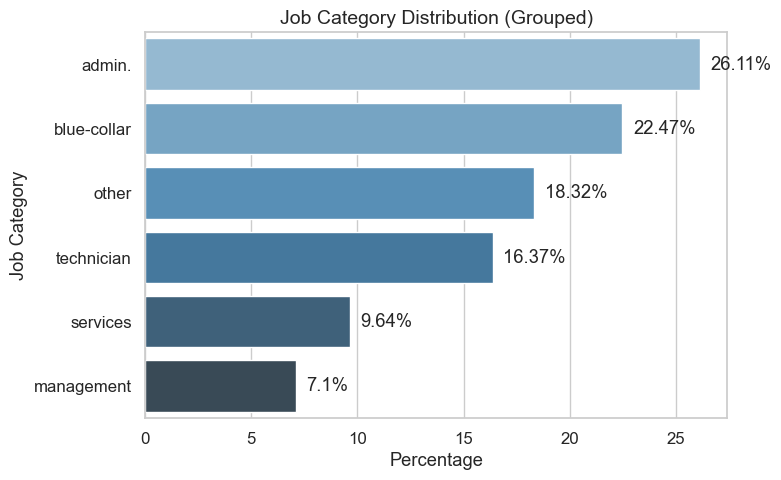

In [99]:
# Calculate percentages for the current job column
job_percent = bank_df['job'].value_counts(normalize=True) * 100
job_percent = job_percent.round(2).rename_axis('job').reset_index(name='percentage')

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(y='job', x='percentage', data=job_percent, palette='Blues_d')

# Annotate bars
for index, row in job_percent.iterrows():
    plt.text(row['percentage'] + 0.5, index, f"{row['percentage']}%", va='center')

plt.title('Job Category Distribution (Grouped)', fontsize=14)
plt.xlabel('Percentage')
plt.ylabel('Job Category')
plt.tight_layout()
plt.show()

In [100]:
# 1 = previously contacted, 0 = nonexistent
bank_df['contacted_prev'] = bank_df['poutcome'].apply(lambda x: 0 if x == 'nonexistent' else 1)
bank_df['contacted_prev'].value_counts()

contacted_prev
0    35561
1     5624
Name: count, dtype: int64

## Visualising Numerical Features 

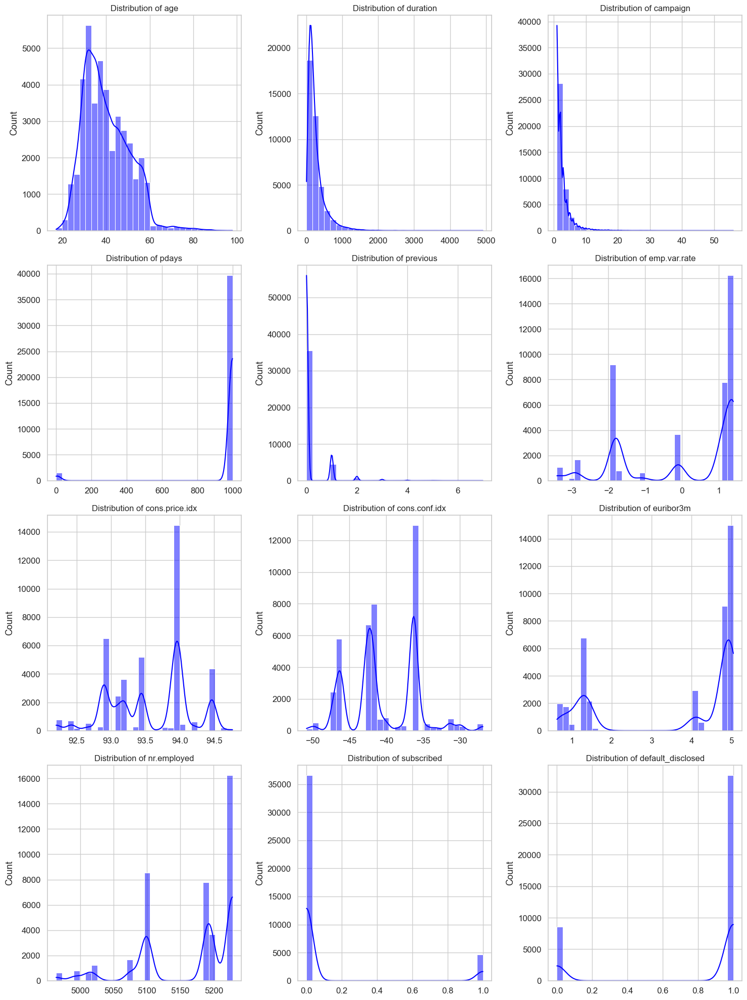

In [101]:
# Visualising our Numerical variables 
# Set aesthetic style
sns.set_style("whitegrid")

# Define number of rows and columns for subplots
num_features = len(numerical_features)
cols = 3  # Number of columns in the grid
rows = (num_features // cols) + (num_features % cols > 0)  # Dynamically calculate rows

# Create figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()  # Flatten the 2D array of axes

# Plot each numerical feature
for i, column in enumerate(numerical_features):
    sns.histplot(bank_df[column], bins=30, kde=True, ax=axes[i], color="blue")
    axes[i].set_title(f"Distribution of {column}", fontsize=12)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("Count")

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

## Feature Engineering our Numerical columns

In [102]:
bank_df["pdays"].value_counts().sort_index()

pdays
0         15
1         26
2         61
3        439
4        118
5         46
6        412
7         60
8         18
9         64
10        52
11        28
12        58
13        36
14        20
15        24
16        11
17         8
18         7
19         3
20         1
21         2
22         3
25         1
26         1
27         1
999    39670
Name: count, dtype: int64

In [103]:
# Function to categorize `pdays`
def categorize_pdays(value):
    if value == 999:
        return "Never Contacted"
    elif value <= 7:
        return "Recently Contacted"
    elif 8 <= value <= 30:
        return "Contacted 1-4 Weeks Ago"
    else:
        return "Contacted Over a Month Ago"

# Apply categorization
bank_df["contact_timing"] = bank_df["pdays"].apply(categorize_pdays)

# Drop the original `pdays` column (since we now have categories)
bank_df.drop(columns=["pdays"], inplace=True)

# Check the new category distribution
print(bank_df["contact_timing"].value_counts())


contact_timing
Never Contacted            39670
Recently Contacted          1177
Contacted 1-4 Weeks Ago      338
Name: count, dtype: int64


## Dropping duration
    The duration variable (call length in seconds) is highly correlated with the target because longer calls often lead to successful subscriptions. However, it is not usable for predictive modeling since it’s only known after the outcome. Including it would lead to data leakage and artificially inflate model performance — hence, it is dropped.

In [104]:
bank_df["duration"].value_counts().sort_index()

duration
0        4
1        3
2        1
3        3
4       12
        ..
3631     1
3643     1
3785     1
4199     1
4918     1
Name: count, Length: 1544, dtype: int64

In [105]:
# Drop the 'duration' column
bank_df.drop(columns=["duration"], inplace=True)

## Visualising Outliers

In [106]:
#Defining numerical features of interest
num_features = [
    'age','campaign','previous',
    'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
    'euribor3m', 'nr.employed'
]

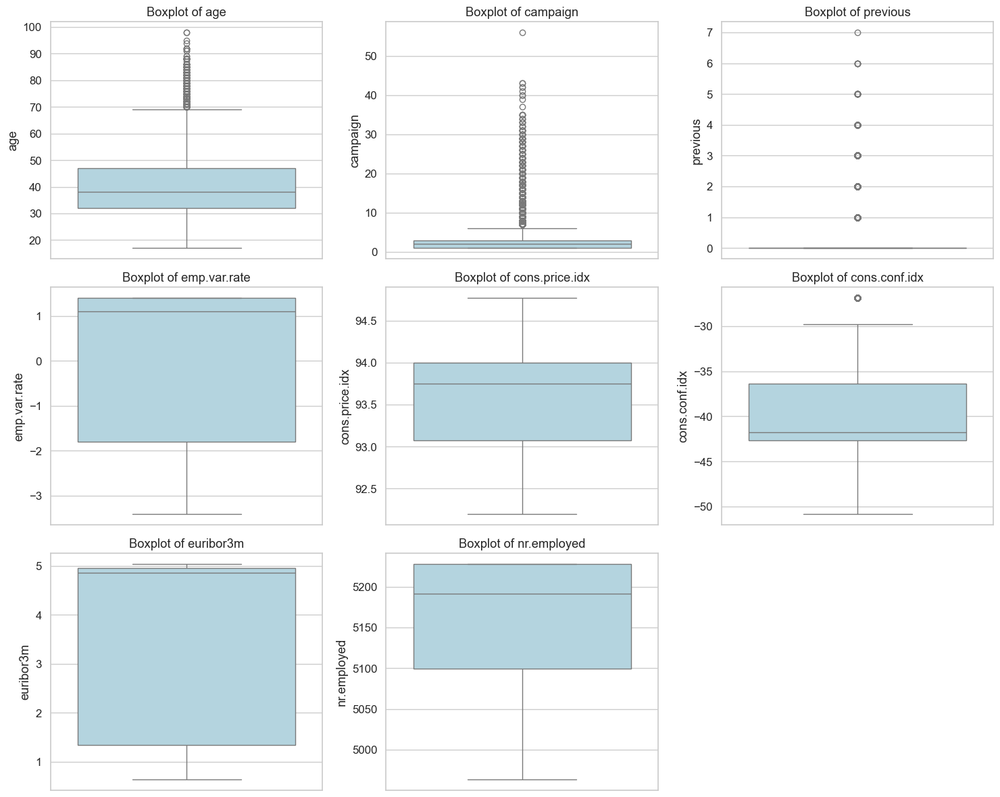

In [107]:
# Set layout
n_cols = 3
n_rows = int(np.ceil(len(num_features) / n_cols))
plt.figure(figsize=(n_cols * 5, n_rows * 4))

# Plot each numerical feature
for i, col in enumerate(num_features, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(y=bank_df[col], color='lightblue')
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()

plt.show()


In [108]:
# Detect outliers using IQR for each numerical feature
for col in num_features:
    Q1 = bank_df[col].quantile(0.25)
    Q3 = bank_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_count = ((bank_df[col] < lower_bound) | (bank_df[col] > upper_bound)).sum()
    print(f"{col}: {outlier_count} outliers")

age: 469 outliers
campaign: 2406 outliers
previous: 5624 outliers
emp.var.rate: 0 outliers
cons.price.idx: 0 outliers
cons.conf.idx: 447 outliers
euribor3m: 0 outliers
nr.employed: 0 outliers


###  Features such as campaign, previous, and age had substantial outliers, prompting closer inspection rather than automatic removal, to retain meaningful variation in client behavior.

In [109]:
bank_df['previous'].value_counts()

previous
0    35561
1     4560
2      754
3      216
4       70
5       18
6        5
7        1
Name: count, dtype: int64

In [110]:
def categorize_previous(x):
    if x == 0:
        return "Not Contacted"
    elif x == 1:
        return "Contacted Once"
    else:
        return "Contacted Multiple Times"

bank_df["previous"] = bank_df["previous"].apply(categorize_previous)

In [111]:
bank_df['previous'].value_counts()

previous
Not Contacted               35561
Contacted Once               4560
Contacted Multiple Times     1064
Name: count, dtype: int64

In [112]:
bank_df['campaign'].value_counts()

campaign
1     17640
2     10569
3      5341
4      2651
5      1599
6       979
7       629
8       400
9       283
10      225
11      177
12      125
13       92
14       69
17       58
16       51
15       51
18       33
20       30
19       26
21       24
22       17
23       16
24       15
27       11
29       10
28        8
26        8
25        8
31        7
30        7
35        5
32        4
33        4
34        3
42        2
40        2
43        2
56        1
39        1
41        1
37        1
Name: count, dtype: int64

In [113]:
def bucket_campaign(x):
    if x == 1:
        return "First Contact"
    elif x <= 3:
        return "Follow-up"
    elif x <= 6:
        return "Aggressive Contact"
    else:
        return "Excessive Contact"

# Apply and drop original
bank_df["campaign_group"] = bank_df["campaign"].apply(bucket_campaign)
bank_df.drop(columns=["campaign"], inplace=True)

# Check distribution
print(bank_df["campaign_group"].value_counts())

campaign_group
First Contact         17640
Follow-up             15910
Aggressive Contact     5229
Excessive Contact      2406
Name: count, dtype: int64


## Explanatory Data Analysis (EDA)

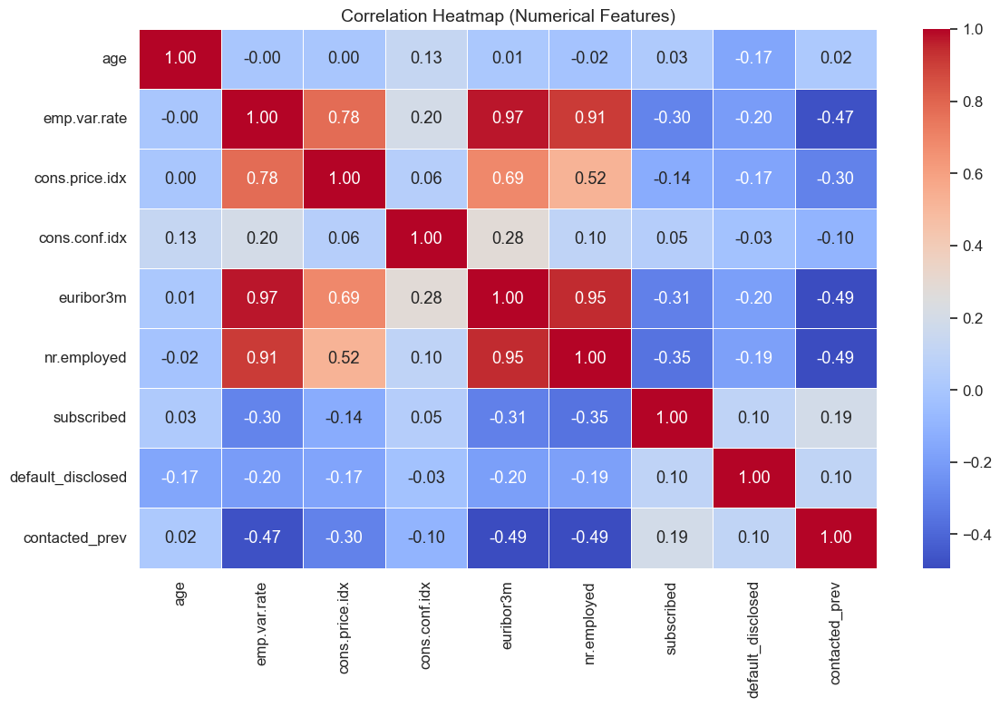

In [114]:
# Select only numerical features
numerical_features = bank_df.select_dtypes(include=['int64', 'float64'])

# Plot correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(numerical_features.corr(), annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap (Numerical Features)", fontsize=14)
plt.tight_layout()
plt.show()


### Categorical variables against Target

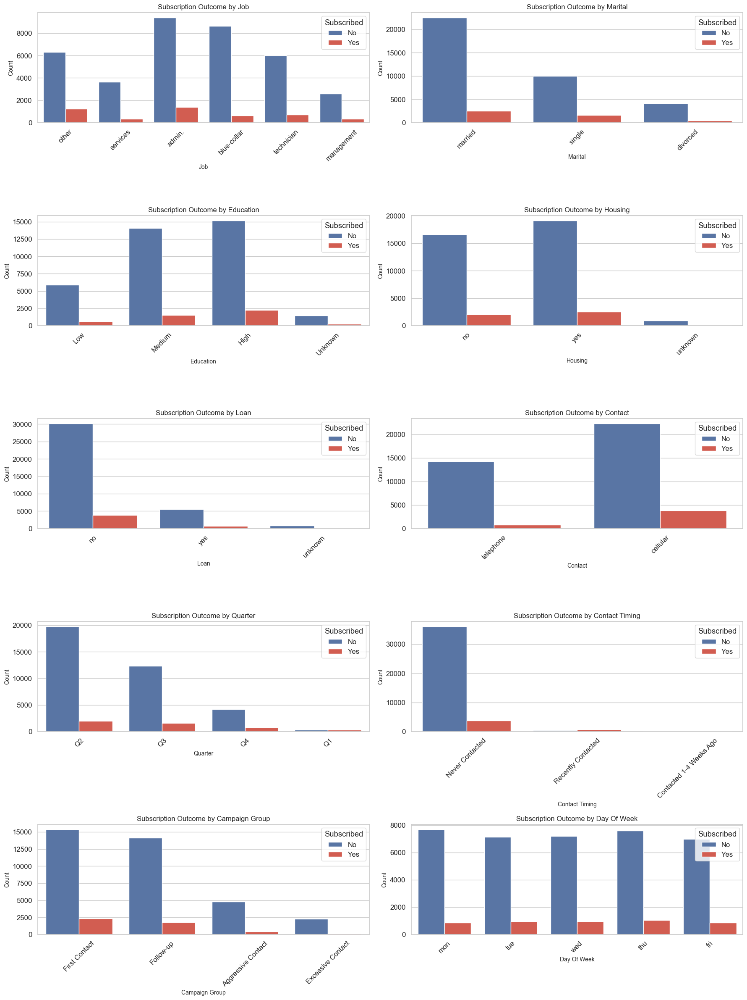

In [115]:
# Define categorical columns of interest
cat_cols = [
    'job', 'marital', 'education', 'housing', 'loan', 
    'contact', 'quarter', 'contact_timing', 'campaign_group', 'day_of_week'
]

# Defining our custom color palette for 'subscribed' (0 = blue, 1 = red)
contrast_palette = {0: '#4c72b0', 1: '#e74c3c'}

# Create subplots: 5 rows x 2 columns
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(18, 24))
axes = axes.flatten()

# Plot each categorical feature
for idx, col in enumerate(cat_cols):
    sns.countplot(ax=axes[idx], data=bank_df, x=col, hue='subscribed', palette=contrast_palette)
    axes[idx].set_title(f"Subscription Outcome by {col.replace('_', ' ').title()}", fontsize=12)
    axes[idx].set_xlabel(col.replace('_', ' ').title(), fontsize=10)
    axes[idx].set_ylabel("Count", fontsize=10)
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title="Subscribed", labels=["No", "Yes"])

plt.tight_layout()
plt.show()


### NUmerical variables against target

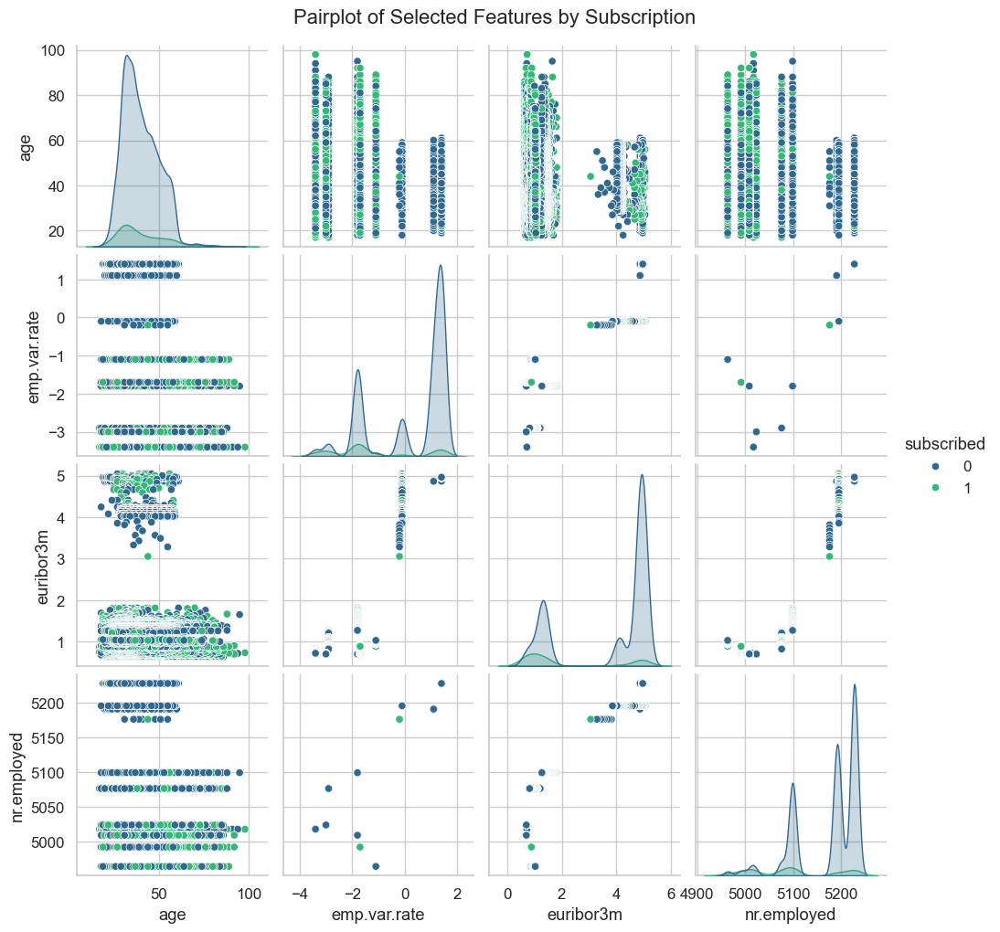

In [116]:
sns.pairplot(bank_df, vars=["age", "emp.var.rate", "euribor3m", "nr.employed"], hue="subscribed", palette="viridis")
plt.suptitle("Pairplot of Selected Features by Subscription", y=1.02)
plt.show()


### Subscription Outcome Distribution




C:\Users\User\AppData\Local\Temp\ipykernel_4072\2328732830.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=counts.index, y=counts.values, palette=colors)


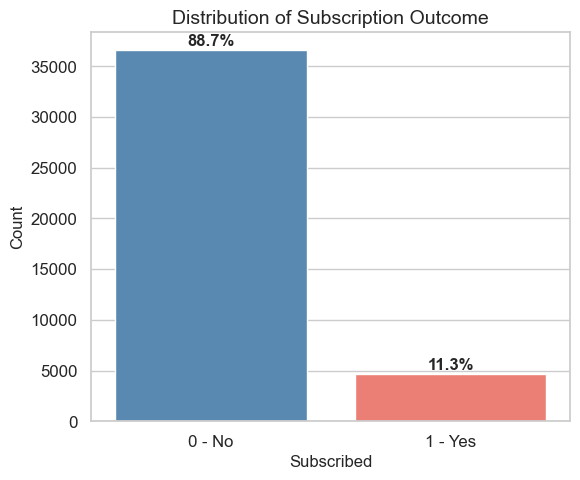

In [117]:
counts = bank_df['subscribed'].value_counts()
percentages = bank_df['subscribed'].value_counts(normalize=True) * 100
labels = counts.index.map({0: "No", 1: "Yes"})
colors = ['#4B8BBE', '#FF6F61']  # Blue for 0, Coral for 1

# Create barplot
plt.figure(figsize=(6, 5))
bars = sns.barplot(x=counts.index, y=counts.values, palette=colors)

# Add text annotations for percentage
for i, (count, pct) in enumerate(zip(counts, percentages)):
    bars.text(i, count + 500, f"{pct:.1f}%", ha='center', fontsize=12, fontweight='bold')

plt.title("Distribution of Subscription Outcome", fontsize=14)
plt.xlabel("Subscribed", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks([0, 1], ['0 - No', '1 - Yes'])
plt.tight_layout()
plt.show()


## Data preprocessing

In [118]:
# Separate features and target
X = bank_df.drop("subscribed", axis=1)
y = bank_df["subscribed"]


In [119]:
# Split with stratification to preserve class distribution
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, stratify=y, random_state=42
)


In [120]:
# Identify features by dtype
categorical_features = bank_df.select_dtypes(include='object').columns.tolist()
numerical_features = bank_df.select_dtypes(include='float64').columns.tolist()

# Define transformers
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

# Assemble full preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ],
    remainder='passthrough'
)

In [121]:
# Fit preprocessor
preprocessor.fit(X_train)

# Transform training data
X_train_transformed = preprocessor.transform(X_train)


In [122]:
# Get encoded categorical feature names
encoded_cat_names = preprocessor.named_transformers_['cat']\
    .named_steps['onehot']\
    .get_feature_names_out(categorical_features)

# Combine all feature names
all_feature_names = numerical_features + list(encoded_cat_names) + \
    [col for col in X_train.columns if col not in (numerical_features + categorical_features)]

# Create a DataFrame from the transformed NumPy array
import pandas as pd

X_train_df = pd.DataFrame(X_train_transformed, columns=all_feature_names)

# View transformed training data
X_train_df.head()


,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_admin.,job_blue-collar,job_management,job_other,job_services,...,contact_timing_Contacted 1-4 Weeks Ago,contact_timing_Never Contacted,contact_timing_Recently Contacted,campaign_group_Aggressive Contact,campaign_group_Excessive Contact,campaign_group_First Contact,campaign_group_Follow-up,age,default_disclosed,contacted_prev
0,0.648095,0.722750,0.883075,0.712004,0.332535,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,34.0,0.0,0.0
1,-1.196219,-1.178427,-1.232257,-1.364117,-0.934692,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,34.0,1.0,1.0
2,0.838886,0.591516,-0.476781,0.773625,0.844114,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,44.0,0.0,0.0
3,-0.115070,-0.648308,-0.325686,0.231703,0.398723,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,49.0,1.0,1.0
4,-1.895787,-2.373355,1.962327,-1.595053,-1.250465,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,34.0,1.0,1.0


In [123]:
# Score tracking dictionary
model_scores = {}

def evaluate_model(name, model, X_test, y_test, y_pred, y_prob):
    # 1. Store metrics
    model_scores[name] = {
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1 Score': f1_score(y_test, y_pred),
        'ROC AUC': roc_auc_score(y_test, y_prob)
    }

    # Pretty print each metric
    print(f"\nEvaluation for {name}")
    for metric, score in model_scores[name].items():
        print(f"{metric:<10}: {score:.4f}")

    # 2. Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=True,
                linewidths=0.5, linecolor='white')
    plt.title(f"Confusion Matrix - {name}", fontsize=14)
    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)
    plt.xticks([0.5, 1.5], ['Class 0', 'Class 1'])
    plt.yticks([0.5, 1.5], ['Class 0', 'Class 1'], rotation=0)
    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    RocCurveDisplay.from_estimator(model, X_test, y_test)
    plt.plot([0, 1], [0, 1], 'r--')
    plt.title(f"ROC Curve - {name}")
    plt.tight_layout()
    plt.show()
    
    # 4. Precision-Recall Curve
    PrecisionRecallDisplay.from_estimator(model, X_test, y_test)
    plt.title(f"Precision-Recall Curve - {name}")
    plt.tight_layout()
    plt.show()

    # 4. Predicted Probability Plot (conditional)
    if name in ["Decision Tree", "Pruned Decision Tree"]:
        plt.figure(figsize=(10, 5))
        sns.histplot(y_prob[y_test == 0], bins=10, color='blue', label='Class 0', kde=False)
        sns.histplot(y_prob[y_test == 1], bins=10, color='red', label='Class 1', kde=False)
        plt.axvline(0.5, color='black', linestyle='--', label='Threshold = 0.5')
        plt.title(f"Predicted Probability Distribution - {name}")
        plt.xlabel("Predicted Probability of Class 1")
        plt.ylabel("Count")
        plt.legend()
        plt.tight_layout()
        plt.show()
    else:
        plt.figure(figsize=(12, 6))
        colors = ['blue' if label == 0 else 'red' for label in y_test]
        plt.scatter(range(len(y_prob)), y_prob, c=colors, edgecolor='k', s=30, alpha=0.7)
        plt.axhline(0.5, color='black', linestyle='--', linewidth=1.5, label='Threshold = 0.5')

        plt.title(f"Predicted Probabilities - {name}", fontsize=14)
        plt.xlabel("Observation Index", fontsize=12)
        plt.ylabel("Predicted Probability of Class 1", fontsize=12)
        handles = [
            plt.Line2D([0], [0], marker='o', color='w', label='Class 0 (blue)',
                    markerfacecolor='blue', markersize=8),
            plt.Line2D([0], [0], marker='o', color='w', label='Class 1 (red)',
                    markerfacecolor='red', markersize=8),
            plt.Line2D([0], [0], color='black', linestyle='--', label='Threshold = 0.5')
        ]
        plt.legend(handles=handles, loc='lower right')
        plt.tight_layout()
        plt.show()



## Logistic Regression

In [124]:
# Create pipeline
logreg_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42))
])

# Fit the model
logreg_pipeline.fit(X_train, y_train)

# Predictions
y_pred_lr = logreg_pipeline.predict(X_test)
y_prob_lr = logreg_pipeline.predict_proba(X_test)[:, 1]


Evaluation for Logistic Regression
Accuracy  : 0.8251
Precision : 0.3518
Recall    : 0.6559
F1 Score  : 0.4580
ROC AUC   : 0.8005


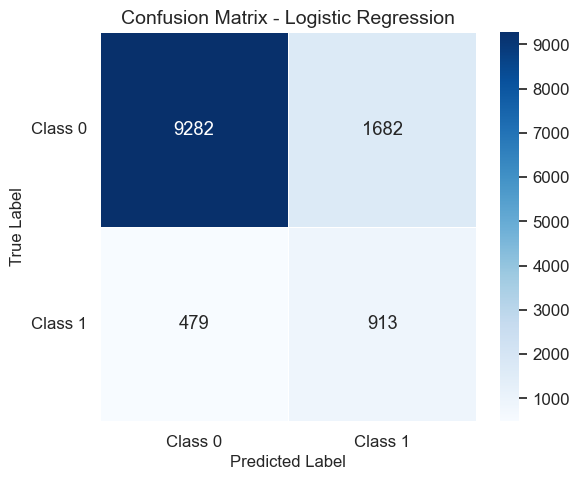

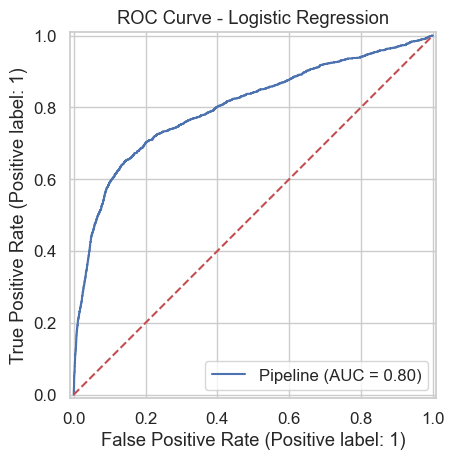

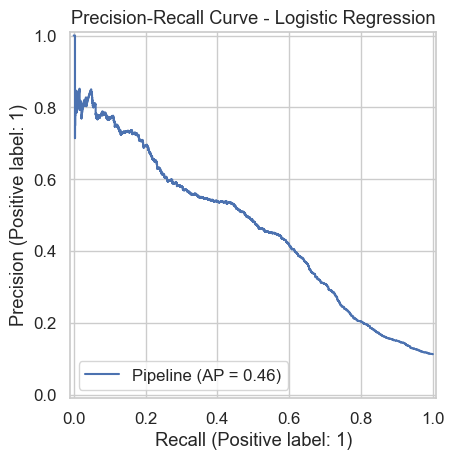

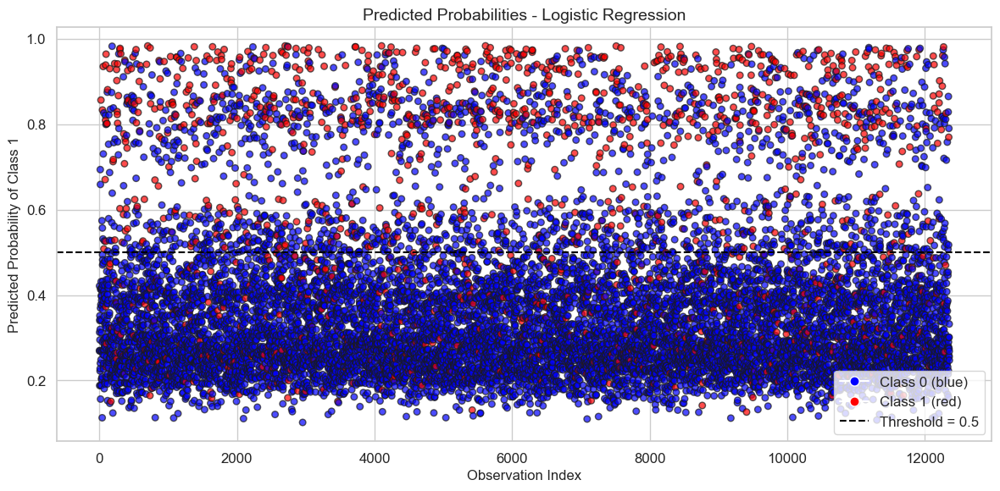

In [125]:
evaluate_model("Logistic Regression", logreg_pipeline, X_test, y_test, y_pred_lr, y_prob_lr)


# Random Forrest Classifier

In [126]:
#from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

# Define Random Forest pipeline
rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(
        n_estimators=100,
        class_weight='balanced', #Due to class imbalance in dataset
        random_state=42
    ))
])


In [127]:
# Fit on training data
rf_pipeline.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_pipeline.predict(X_test)
y_prob_rf = rf_pipeline.predict_proba(X_test)[:, 1]


Evaluation for Random Forest
Accuracy  : 0.8916
Precision : 0.5366
Recall    : 0.2795
F1 Score  : 0.3675
ROC AUC   : 0.7758


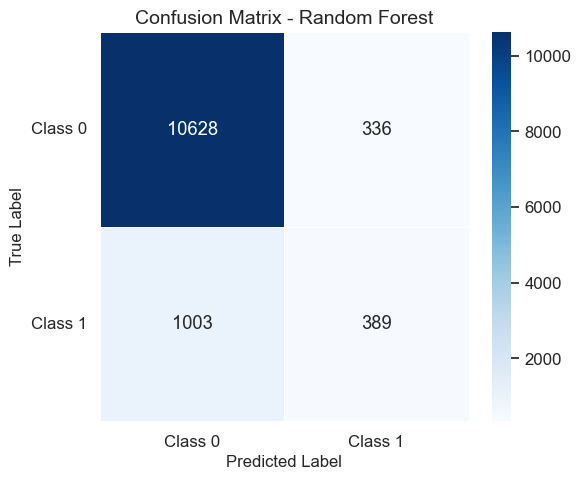

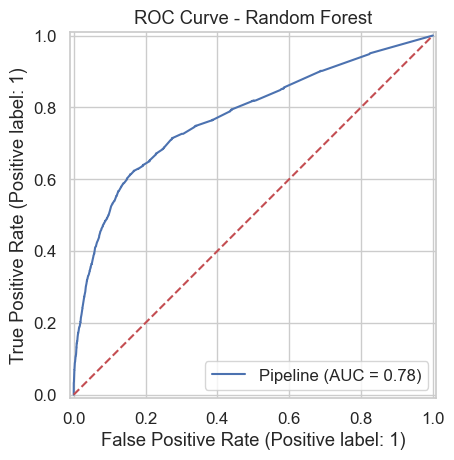

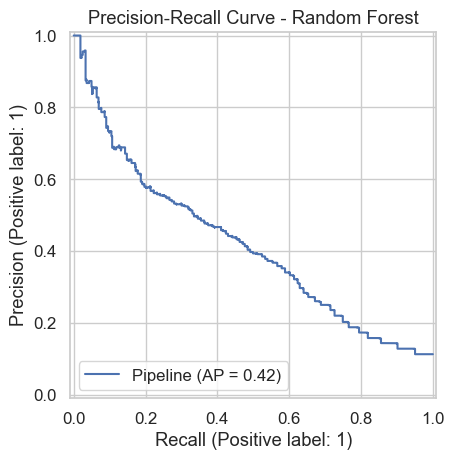

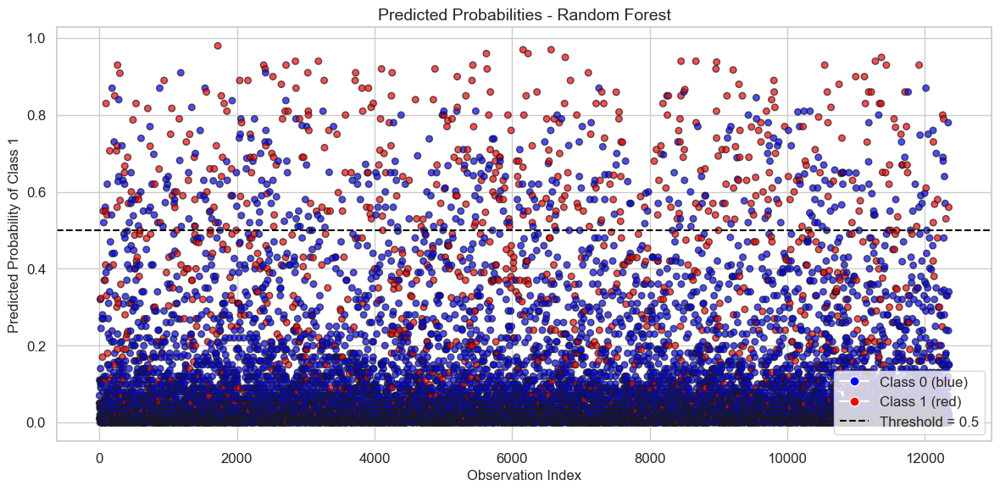

In [128]:
evaluate_model("Random Forest", rf_pipeline, X_test, y_test, y_pred_rf, y_prob_rf)


C:\Users\User\AppData\Local\Temp\ipykernel_4072\2212962461.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=rf_feat_imp.head(5), x='Importance', y='Feature', palette='Blues_d')


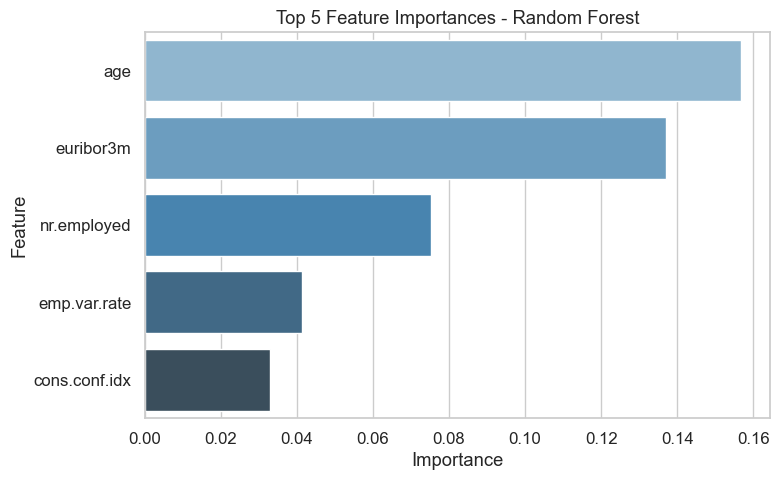

In [129]:
# Get feature importances from your Random Forest pipeline
rf_importances = rf_pipeline.named_steps['classifier'].feature_importances_

# Create DataFrame for importance
rf_feat_imp = pd.DataFrame({
    'Feature': all_feature_names,
    'Importance': rf_importances
}).sort_values(by='Importance', ascending=False)

# Plot top 5
plt.figure(figsize=(8, 5))
sns.barplot(data=rf_feat_imp.head(5), x='Importance', y='Feature', palette='Blues_d')
plt.title("Top 5 Feature Importances - Random Forest")
plt.tight_layout()
plt.show()


# Decision Tree Classifier

In [130]:
# Define unpruned decision tree pipeline
dt_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(
        class_weight='balanced',  # Handle imbalance
        random_state=42
    ))
])


In [131]:
# Train
dt_pipeline.fit(X_train, y_train)

# Predict
y_pred_dt = dt_pipeline.predict(X_test)
y_prob_dt = dt_pipeline.predict_proba(X_test)[:, 1]



Evaluation for Decision Tree
Accuracy  : 0.8423
Precision : 0.3101
Recall    : 0.3261
F1 Score  : 0.3179
ROC AUC   : 0.6174


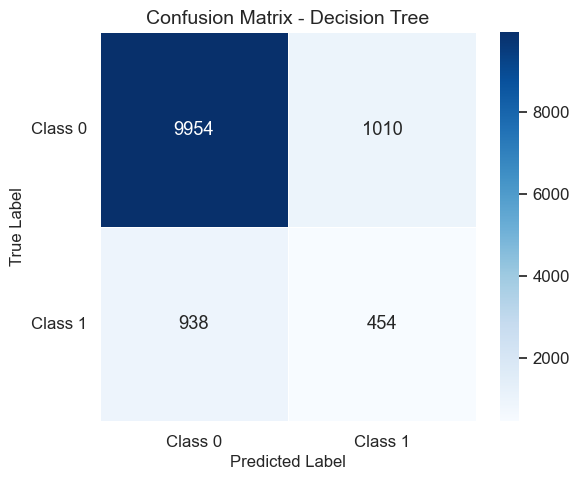

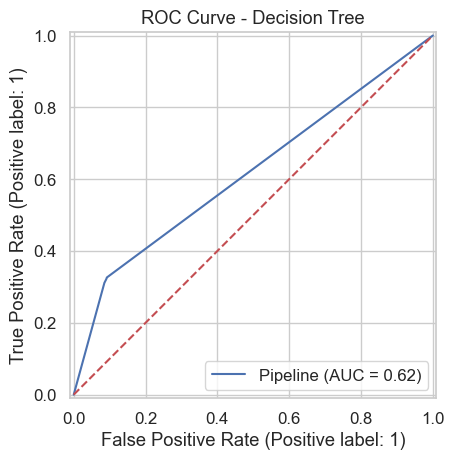

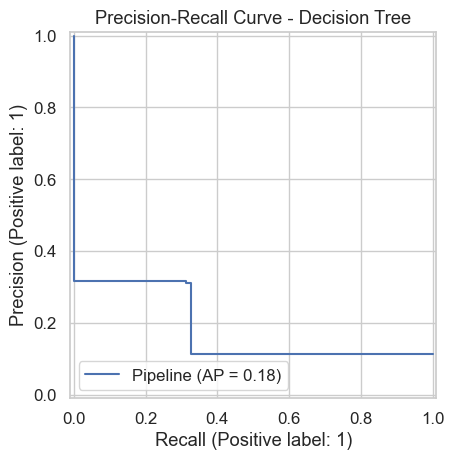

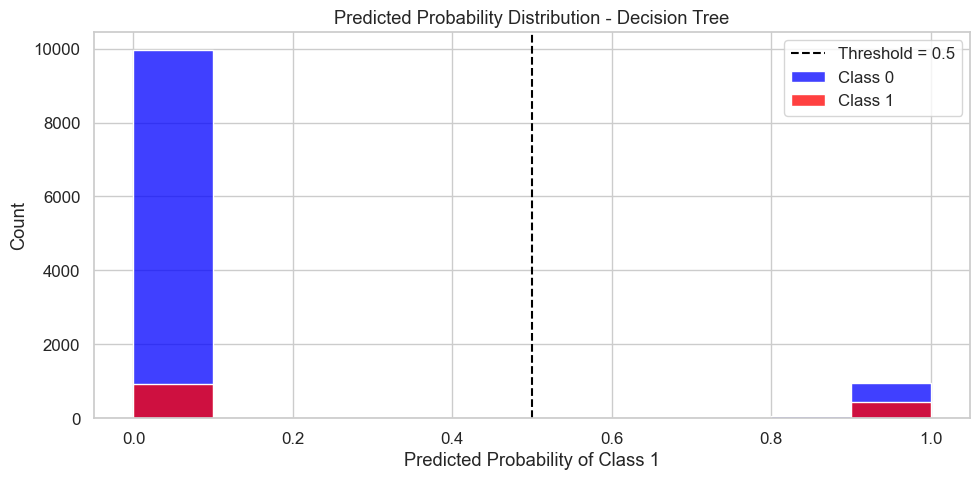

In [132]:
evaluate_model("Decision Tree", dt_pipeline, X_test, y_test, y_pred_dt, y_prob_dt)


C:\Users\User\AppData\Local\Temp\ipykernel_4072\3093692993.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tree_feat_imp.head(5), x='Importance', y='Feature', palette='Oranges_d')


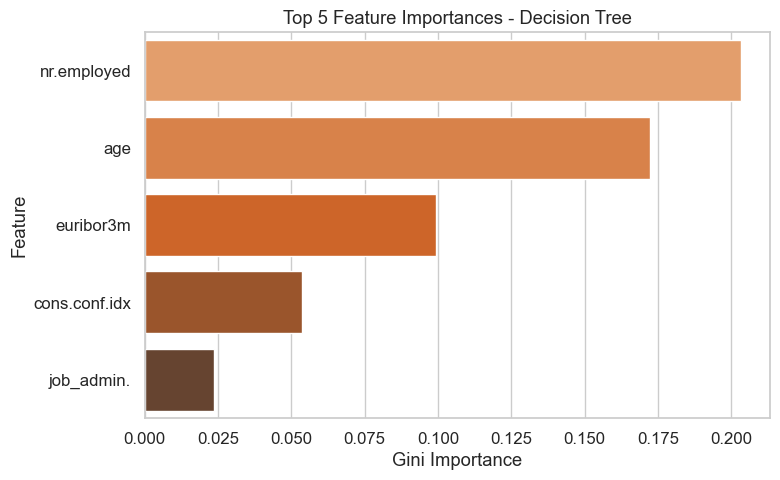

In [133]:
tree_importances = dt_pipeline.named_steps['classifier'].feature_importances_

# Create DataFrame
tree_feat_imp = pd.DataFrame({
    'Feature': all_feature_names,
    'Importance': tree_importances
}).sort_values(by='Importance', ascending=False)

# Plot top 5 features
plt.figure(figsize=(8, 5))
sns.barplot(data=tree_feat_imp.head(5), x='Importance', y='Feature', palette='Oranges_d')
plt.title("Top 5 Feature Importances - Decision Tree")
plt.xlabel("Gini Importance")
plt.tight_layout()
plt.show()

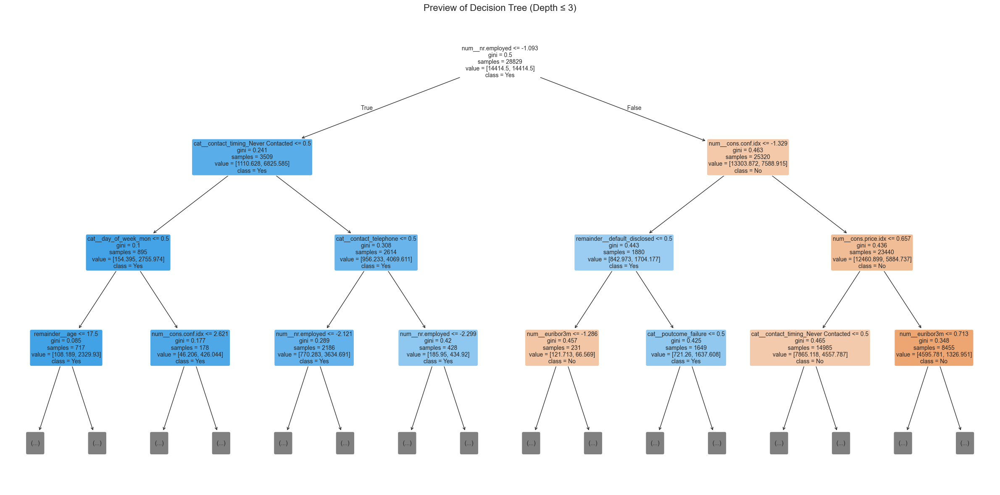

In [134]:
# Get fitted tree from your pipeline
dt_model = dt_pipeline.named_steps['classifier']

# Use feature names from preprocessed data
feature_names = preprocessor.get_feature_names_out()

# Plot
plt.figure(figsize=(24, 12))
plot_tree(
    dt_model,
    feature_names=feature_names,
    class_names=['No', 'Yes'],
    filled=True,
    rounded=True,
    max_depth=3,              # Limit depth for readability
    fontsize=10
)
plt.title("Preview of Decision Tree (Depth ≤ 3)", fontsize=16)
plt.tight_layout()
plt.show()


In [135]:
# Generate readable structure
tree_rules = export_text(dt_model, feature_names=list(feature_names))
print(tree_rules)


|--- num__nr.employed <= -1.09
|   |--- cat__contact_timing_Never Contacted <= 0.50
|   |   |--- cat__day_of_week_mon <= 0.50
|   |   |   |--- remainder__age <= 17.50
|   |   |   |   |--- class: 0
|   |   |   |--- remainder__age >  17.50
|   |   |   |   |--- num__nr.employed <= -1.61
|   |   |   |   |   |--- remainder__age <= 90.00
|   |   |   |   |   |   |--- cat__campaign_group_Aggressive Contact <= 0.50
|   |   |   |   |   |   |   |--- num__cons.price.idx <= 1.91
|   |   |   |   |   |   |   |   |--- cat__day_of_week_fri <= 0.50
|   |   |   |   |   |   |   |   |   |--- cat__contact_timing_Contacted 1-4 Weeks Ago <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- cat__education_Unknown <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 15
|   |   |   |   |   |   |   |   |   |   |--- cat__education_Unknown >  0.50
|   |   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |   |--- cat__contact_timing_Contacted 1-4 Weeks A

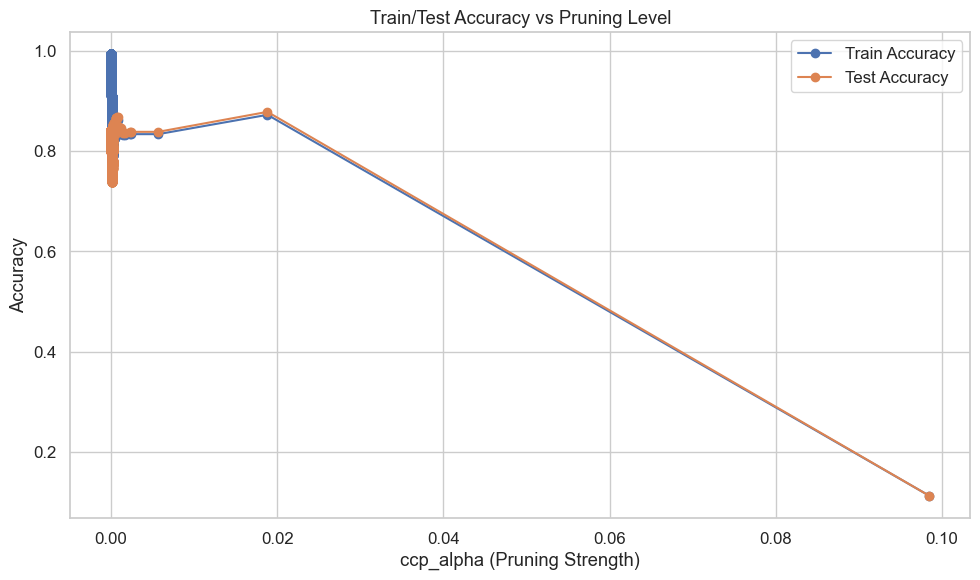

Optimal ccp_alpha selected: 0.01882

Evaluation for Pruned Decision Tree
Accuracy  : 0.8782
Precision : 0.4612
Recall    : 0.4820
F1 Score  : 0.4714
ROC AUC   : 0.7053


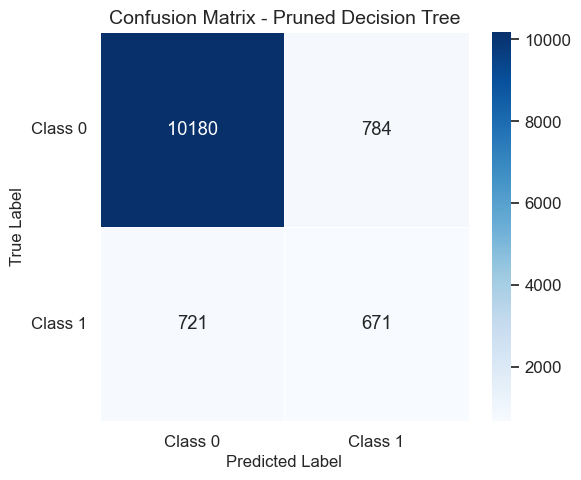

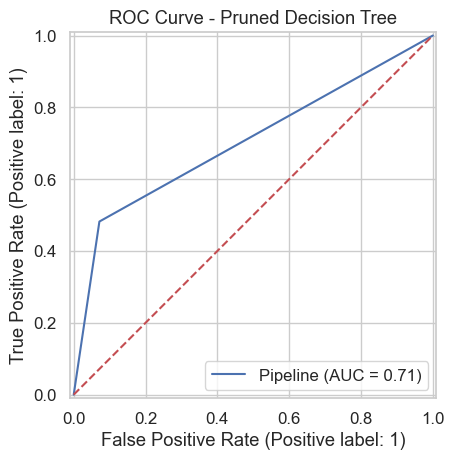

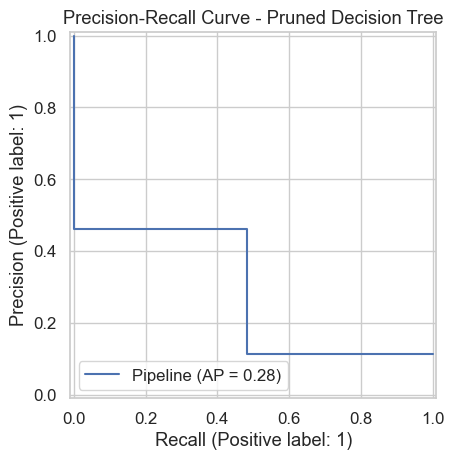

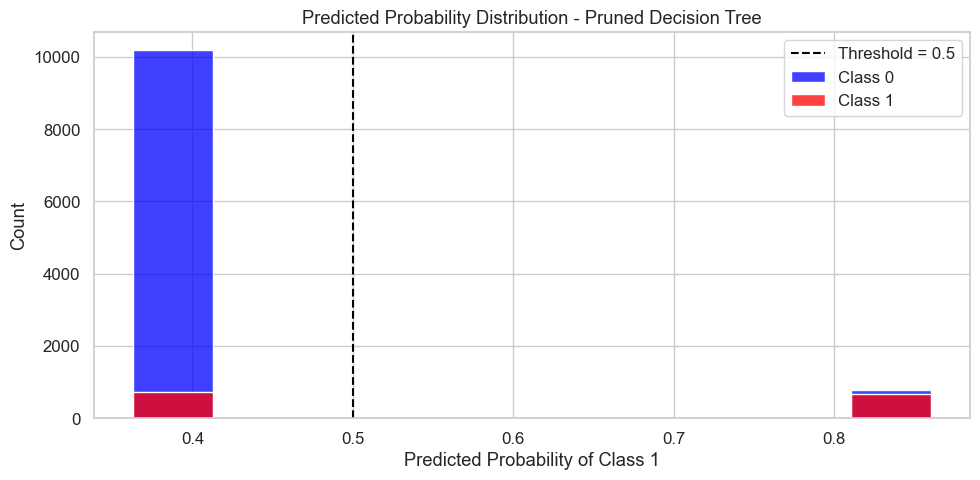

In [136]:
# Transforming data manually using the preprocessor
X_train_transformed = preprocessor.fit_transform(X_train)
X_test_transformed = preprocessor.transform(X_test)

# Train initial unpruned tree to get the pruning path
unpruned_tree = DecisionTreeClassifier(random_state=42, class_weight='balanced')
path = unpruned_tree.cost_complexity_pruning_path(X_train_transformed, y_train)

# Extract valid alphas (≥ 0 only)
ccp_alphas = np.clip(path.ccp_alphas, 0, None)

# Train models for each alpha
clfs = []
for alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=42, class_weight='balanced', ccp_alpha=alpha)
    clf.fit(X_train_transformed, y_train)
    clfs.append(clf)

# Evaluate models to find optimal alpha
train_scores = [clf.score(X_train_transformed, y_train) for clf in clfs]
test_scores = [clf.score(X_test_transformed, y_test) for clf in clfs]

# Plotting alpha vs. performance
plt.figure(figsize=(10, 6))
plt.plot(ccp_alphas, train_scores, label="Train Accuracy", marker='o')
plt.plot(ccp_alphas, test_scores, label="Test Accuracy", marker='o')
plt.xlabel("ccp_alpha (Pruning Strength)")
plt.ylabel("Accuracy")
plt.title("Train/Test Accuracy vs Pruning Level")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Pick alpha with best test accuracy (or just before it drops)
best_index = np.argmax(test_scores)
optimal_alpha = ccp_alphas[best_index]
print(f"Optimal ccp_alpha selected: {optimal_alpha:.5f}")

# Train final pruned model INSIDE pipeline
pruned_tree = DecisionTreeClassifier(random_state=42, class_weight='balanced', ccp_alpha=optimal_alpha)

dt_pruned_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', pruned_tree)
])

dt_pruned_pipeline.fit(X_train, y_train)

# STEP 8: Predict + Evaluate
y_pred_pruned = dt_pruned_pipeline.predict(X_test)
y_prob_pruned = dt_pruned_pipeline.predict_proba(X_test)[:, 1]

evaluate_model("Pruned Decision Tree", dt_pruned_pipeline, X_test, y_test, y_pred_pruned, y_prob_pruned)


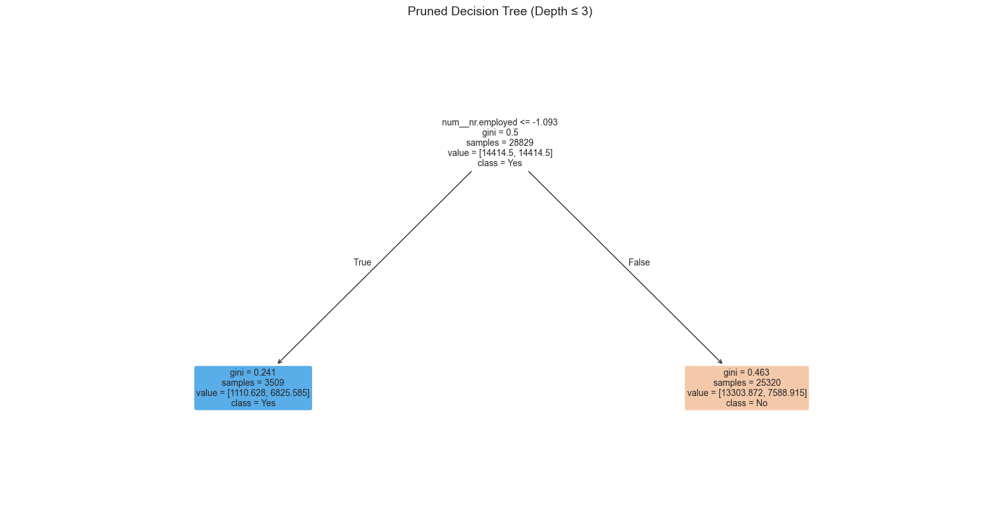

|--- num__nr.employed <= -1.09
|   |--- class: 1
|--- num__nr.employed >  -1.09
|   |--- class: 0



In [137]:
# Visualize pruned tree (limit depth for clarity)
final_tree = dt_pruned_pipeline.named_steps['classifier']
feature_names = preprocessor.get_feature_names_out()

plt.figure(figsize=(20, 10))
plot_tree(final_tree, feature_names=feature_names, class_names=['No', 'Yes'],
          filled=True, max_depth=3, fontsize=10, rounded=True)
plt.title("Pruned Decision Tree (Depth ≤ 3)", fontsize=14)
plt.show()

# Export readable rules
rules_text = export_text(final_tree, feature_names=list(feature_names))
print(rules_text)



Evaluation for XGBoost
Accuracy  : 0.8404
Precision : 0.3703
Recall    : 0.5948
F1 Score  : 0.4564
ROC AUC   : 0.7755


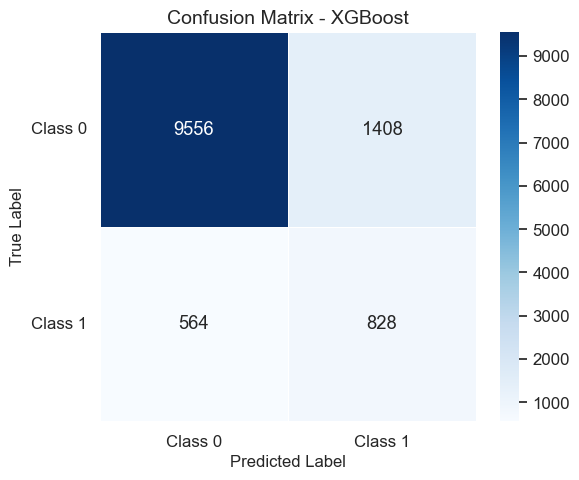

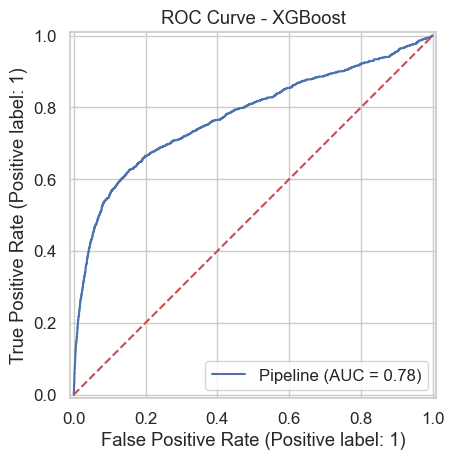

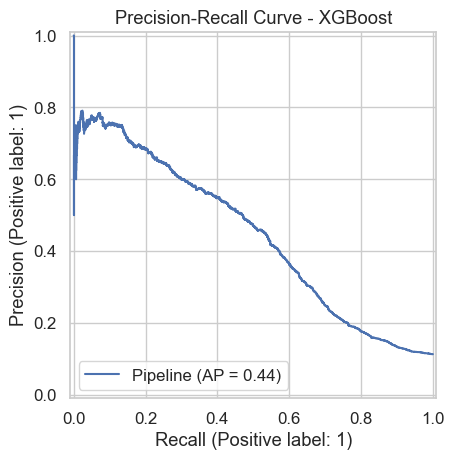

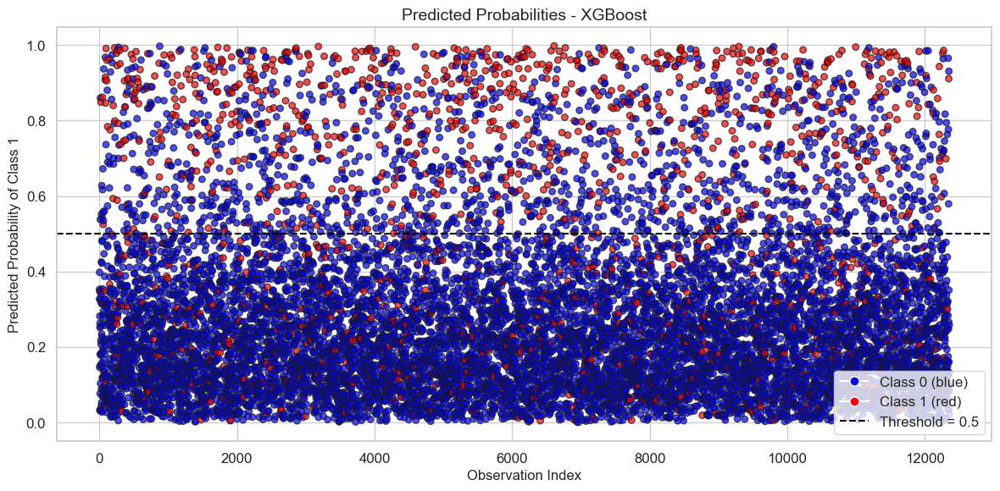

In [138]:
# 1. Define class imbalance ratio
imbalance_ratio = y.value_counts()[0] / y.value_counts()[1]  # ~7.87

# 2. Build XGBoost pipeline
xgb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', XGBClassifier(
        scale_pos_weight=imbalance_ratio,  # Corrects class imbalance
        use_label_encoder=False,           # Removes unnecessary warning
        eval_metric='logloss',             # Stable for classification
        random_state=42,
        verbosity=0
    ))
])

# 3. Fit model
xgb_pipeline.fit(X_train, y_train)

# 4. Predict
y_pred_xgb = xgb_pipeline.predict(X_test)
y_prob_xgb = xgb_pipeline.predict_proba(X_test)[:, 1]  # probability of class 1

# 5. Evaluate using your custom visualizer
evaluate_model("XGBoost", xgb_pipeline, X_test, y_test, y_pred_xgb, y_prob_xgb)

C:\Users\User\AppData\Local\Temp\ipykernel_4072\2722165795.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=xgb_feat_imp.head(5), x='Importance', y='Feature', palette='Greens_d')


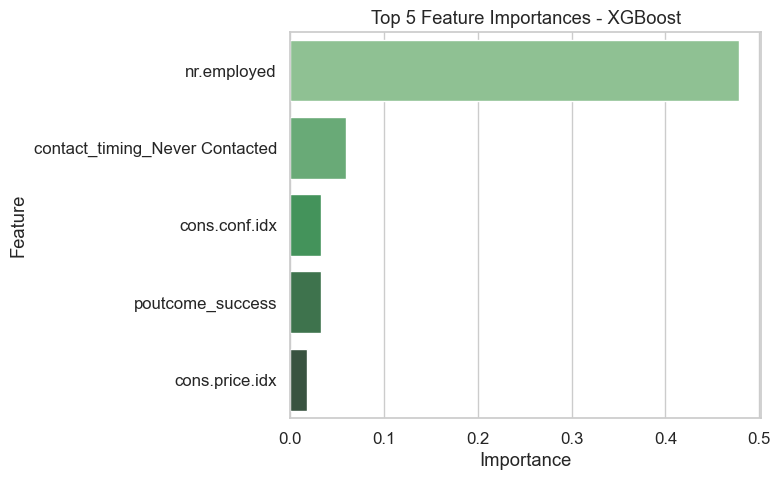

In [139]:
importances = xgb_pipeline.named_steps['classifier'].feature_importances_
xgb_feat_imp = pd.DataFrame({
    'Feature': all_feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot top 15
plt.figure(figsize=(8, 5))
sns.barplot(data=xgb_feat_imp.head(5), x='Importance', y='Feature', palette='Greens_d')
plt.title("Top 5 Feature Importances - XGBoost")
plt.tight_layout()
plt.show()


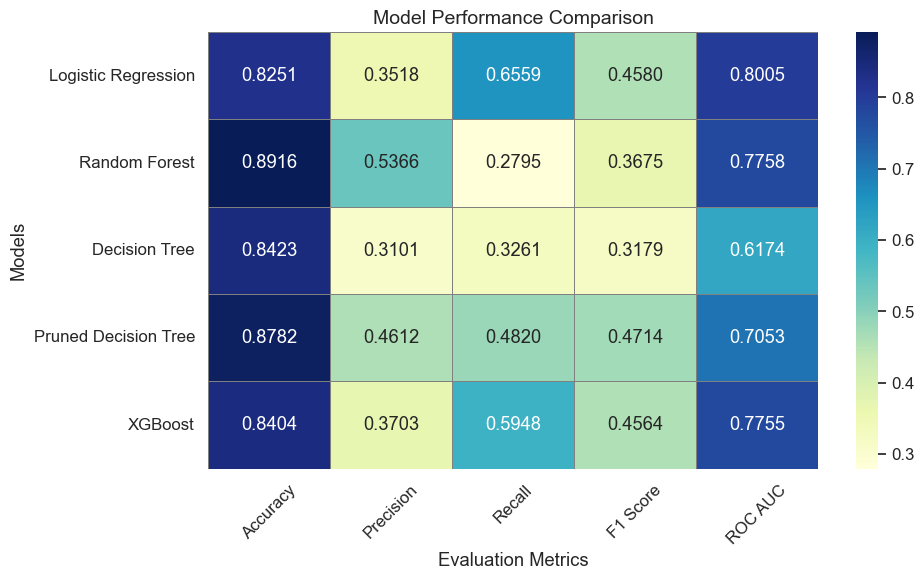

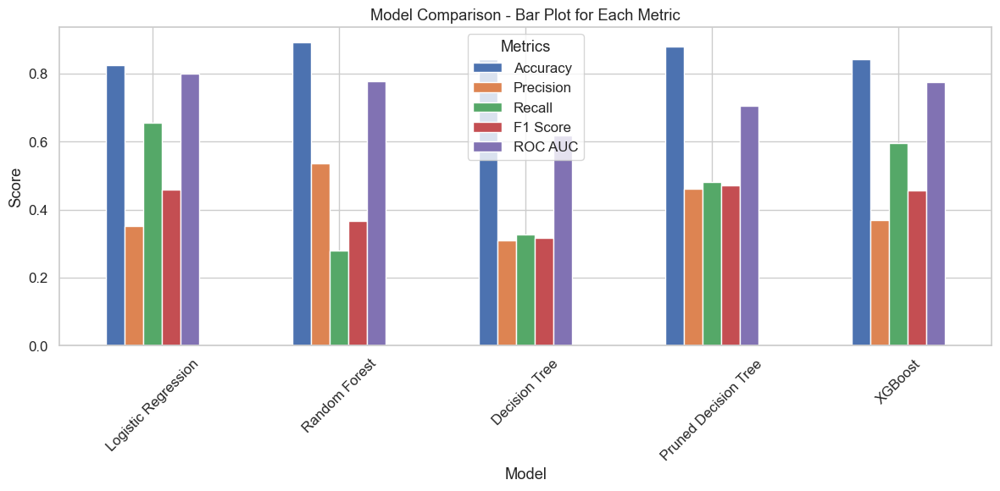

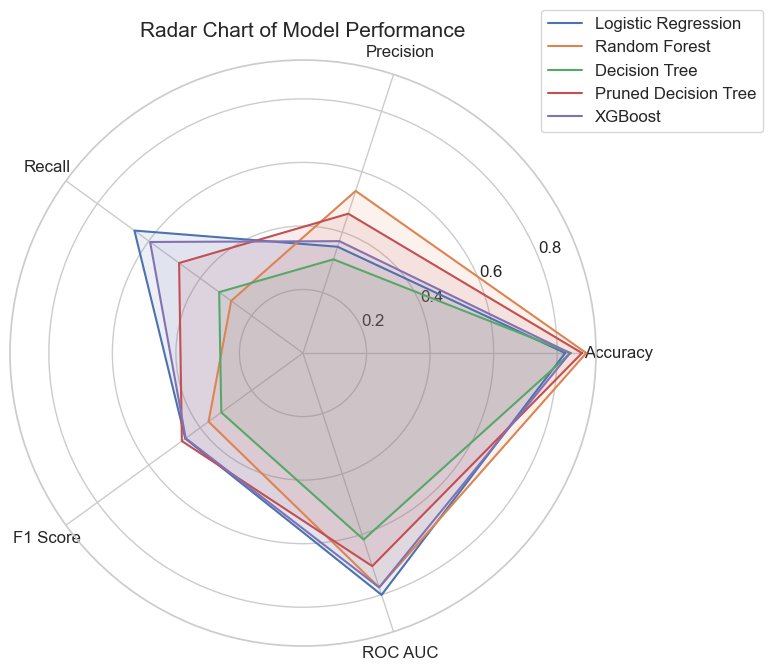

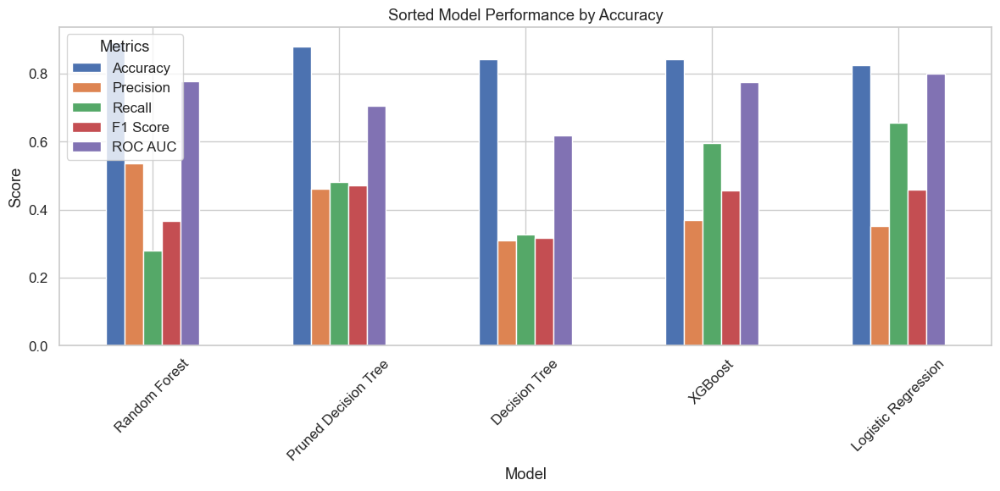

In [140]:
# Convert model_scores dictionary into DataFrame
scores_df = pd.DataFrame(model_scores).T  # Transpose so models are rows

# 1. Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(scores_df, annot=True, cmap='YlGnBu', linewidths=0.5, linecolor='gray', fmt='.4f')
plt.title("Model Performance Comparison", fontsize=14)
plt.ylabel("Models")
plt.xlabel("Evaluation Metrics")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2. Grouped Bar Plot
scores_df.plot(kind='bar', figsize=(12, 6))
plt.title("Model Comparison - Bar Plot for Each Metric")
plt.ylabel("Score")
plt.xlabel("Model")
plt.xticks(rotation=45)
plt.legend(title="Metrics")
plt.tight_layout()
plt.show()

# 3. Radar Chart
categories = list(scores_df.columns)
labels = list(scores_df.index)
num_vars = len(categories)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

plt.figure(figsize=(8, 8))
for i in range(len(scores_df)):
    values = scores_df.iloc[i].tolist()
    values += values[:1]
    plt.polar(angles, values, label=labels[i])
    plt.fill(angles, values, alpha=0.1)
plt.xticks(angles[:-1], categories)
plt.title("Radar Chart of Model Performance", size=15)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.tight_layout()
plt.show()

# 4. Sorted Bar Plot by Accuracy
sorted_df = scores_df.sort_values(by='Accuracy', ascending=False)
sorted_df.plot(kind='bar', figsize=(12, 6))
plt.title("Sorted Model Performance by Accuracy")
plt.ylabel("Score")
plt.xlabel("Model")
plt.xticks(rotation=45)
plt.legend(title="Metrics")
plt.tight_layout()
plt.show()
